In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import numpy as np
import shap
from scipy.ndimage import gaussian_filter1d
from sklearn.inspection import partial_dependence
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

c:\Users\annal\OneDrive\Dokumente\Year Two\Dissertation\Coding_UKHLA\dissertation\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Replace with your CSV file's path
file_path = "C:/Users/annal/OneDrive/Dokumente/Year Two/Dissertation/Coding_UKHLA/klm_indresp.csv"

In [3]:
# Load each file
indresp = pd.read_csv('C:/Users/annal/OneDrive/Dokumente/Year Two/Dissertation/Coding_UKHLA/klm_indresp.csv', delimiter=',')
indall = pd.read_csv('C:/Users/annal/OneDrive/Dokumente/Year Two/Dissertation/Coding_UKHLA/klm_indall.tab', delimiter='\t')
hhresp = pd.read_csv('C:/Users/annal/OneDrive/Dokumente/Year Two/Dissertation/Coding_UKHLA/klm_hhresp.tab', delimiter='\t')

C:\Users\annal\AppData\Local\Temp\ipykernel_13764\2449588421.py:2: DtypeWarning: Columns (1182) have mixed types. Specify dtype option on import or set low_memory=False.
  indresp = pd.read_csv('C:/Users/annal/OneDrive/Dokumente/Year Two/Dissertation/Coding_UKHLA/klm_indresp.csv', delimiter=',')


In [4]:
# This will return a boolean Series where True indicates a duplicate
duplicates = indresp.duplicated(subset=['pidp', 'klm_wave'], keep=False)

# To see the duplicate rows
duplicate_rows = indresp[duplicates]
print(duplicate_rows)

Empty DataFrame
Columns: [pidp, pid, klm_hidp, k_hidp, l_hidp, m_hidp, klm_pno, klm_wave, klm_childpno, klm_hhorig, klm_memorig, klm_psu, klm_strata, klm_sampst, klm_month, klm_quarter, klm_ivfio, klm_ioutcome, klm_sex, klm_dvage, klm_birthy, klm_chkwebdoby, klm_chkrespweb1, klm_chkrespweb2, klm_chkrespweb3, klm_chkrespweb4, klm_chkwebsex, klm_nchunder16, klm_nch5to15, klm_nch10to15, klm_nch10, klm_nunder16abs, klm_n1619abs, klm_nchresp, klm_nch14resp, klm_nch415resp, klm_nch3resp, klm_nch5resp, klm_nch8resp, klm_respchild1, klm_respchild2, klm_respchild3, klm_respchild4, klm_respchild5, klm_respchild6, klm_respchild7, klm_respchild8, klm_respchild9, klm_respchild10, klm_respchild11, klm_respchild12, klm_respchild13, klm_respchild14, klm_respchild15, klm_respchild16, klm_nadoptch, klm_adoptchonly, klm_nnatch, klm_nstepch, klm_sibling, klm_pwcu18abs1, klm_pwcu18abs2, klm_pwcu18abs3, klm_pwcu18abs4, klm_pwcu18abs5, klm_pwcu18abs6, klm_pwcu18abs7, klm_pwcu18abs8, klm_pwcu18abs9, klm_pwcu1

In [5]:
# Assuming indresp and hhresp are already loaded from the files
UKHLA = pd.merge(indresp, hhresp, on='klm_hidp', how='left')


In [6]:
# Count the rows and columns for each dataset
rows1, columns1 = indresp.shape
rows2, columns2 = hhresp.shape
rows3, columns3 = UKHLA.shape

print(f"indresp: {rows1} rows, {columns1} columns")
print(f"indall: {rows2} rows, {columns2} columns")
print(f"UKHLA: {rows3} rows, {columns3} columns")

indresp: 28647 rows, 2026 columns
indall: 16417 rows, 317 columns
UKHLA: 28647 rows, 2342 columns


In [7]:
UKHLA_one = UKHLA.copy()
UKHLA_two = UKHLA.copy()
UKHLA_three = UKHLA.copy()

In [8]:
UKHLA.shape

(28647, 2342)

In [9]:
UKHLA['klm_sclfsato'].describe()

count    28646.000000
mean         4.983698
std          1.987036
min         -9.000000
25%          4.000000
50%          6.000000
75%          6.000000
max          7.000000
Name: klm_sclfsato, dtype: float64

missing	-9	
inapplicable -8	
proxy	-7	
refusal	-2	
don't know	-1	
Completely dissatisfied	1	
Mostly dissatisfied	2	
Somewhat dissatisfied	3	
Neither Sat nor Dissat	4	
Somewhat satisfied	5	
Mostly satisfied	6	
Completely satisfied	7	

In [10]:
answer_counts = UKHLA['klm_sclfsato'].value_counts()

print("Count of answers:")
print(answer_counts)

Count of answers:
klm_sclfsato
 6.0    12054
 5.0     5595
 4.0     3316
 7.0     3138
 3.0     2308
 2.0     1212
 1.0      482
-2.0      192
-7.0      146
-9.0      105
-1.0       77
-8.0       21
Name: count, dtype: int64


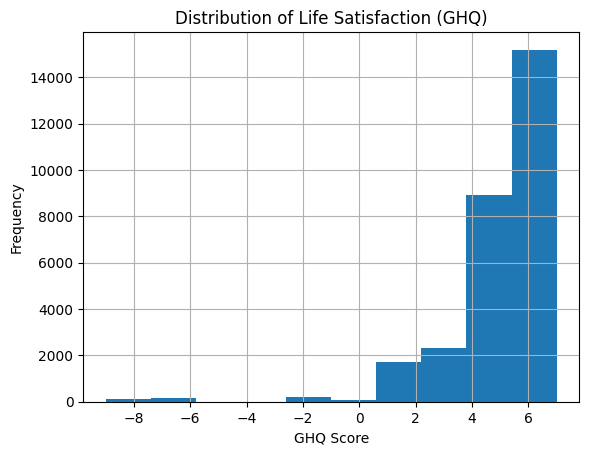

In [11]:
# Histogram 
UKHLA['klm_sclfsato'].hist(bins=10)
plt.title('Distribution of Life Satisfaction (GHQ)')
plt.xlabel('GHQ Score')
plt.ylabel('Frequency')
plt.show()

In [12]:
answer_counts = UKHLA['klm_dvage'].value_counts()

print("Count of answers:")
print(answer_counts)

Count of answers:
klm_dvage
 56     612
 53     572
 55     557
 59     554
 52     551
       ... 
 101      1
 100      1
-8        1
-9        1
-1        1
Name: count, Length: 89, dtype: int64


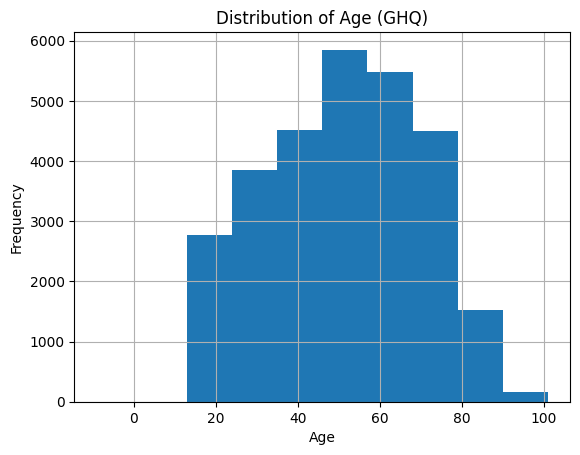

In [13]:
# Histogram for 'klm_dvage'
UKHLA['klm_dvage'].hist(bins=10)
plt.title('Distribution of Age (GHQ)')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

In [14]:
conditions_detailed = [
    (UKHLA['klm_dvage'] >= 16) & (UKHLA['klm_dvage'] < 20),
    (UKHLA['klm_dvage'] >= 20) & (UKHLA['klm_dvage'] < 25),
    (UKHLA['klm_dvage'] >= 25) & (UKHLA['klm_dvage'] < 30),
    (UKHLA['klm_dvage'] >= 30) & (UKHLA['klm_dvage'] < 35),
    (UKHLA['klm_dvage'] >= 35) & (UKHLA['klm_dvage'] < 40),
    (UKHLA['klm_dvage'] >= 40) & (UKHLA['klm_dvage'] < 45),
    (UKHLA['klm_dvage'] >= 45) & (UKHLA['klm_dvage'] < 50),
    (UKHLA['klm_dvage'] >= 50) & (UKHLA['klm_dvage'] < 55),
    (UKHLA['klm_dvage'] >= 55) & (UKHLA['klm_dvage'] < 60),
    (UKHLA['klm_dvage'] >= 60) & (UKHLA['klm_dvage'] < 65),
    (UKHLA['klm_dvage'] >= 65) & (UKHLA['klm_dvage'] < 70),
    (UKHLA['klm_dvage'] >= 70) & (UKHLA['klm_dvage'] < 75),
    (UKHLA['klm_dvage'] >= 75) & (UKHLA['klm_dvage'] < 80),
    (UKHLA['klm_dvage'] >= 80) & (UKHLA['klm_dvage'] < 85),
    (UKHLA['klm_dvage'] >= 85) & (UKHLA['klm_dvage'] < 90),
    (UKHLA['klm_dvage'] >= 90),
]

# Define the corresponding labels
choices_detailed = [
    '16-19', '20-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', 
    '60-64', '65-69', '70-74', '75-79', '80-84', '85-90', '90+'
]

In [15]:
# Create the new detailed age group variable
UKHLA['age_grouped_one'] = np.select(conditions_detailed, choices_detailed)

# Display the new age groups
print(UKHLA[['klm_dvage', 'age_grouped_one']])

       klm_dvage age_grouped_one
0             63           60-64
1             43           40-44
2             35           35-39
3             57           55-59
4             60           60-64
...          ...             ...
28642         50           50-54
28643         75           75-79
28644         33           30-34
28645         66           65-69
28646         78           75-79

[28647 rows x 2 columns]


In [16]:
# Count the frequency of each age group
age_group_counts = UKHLA['age_grouped_one'].value_counts()

print("Count of age ranges in age_grouped_one:")
print(age_group_counts)

Count of age ranges in age_grouped_one:
age_grouped_one
55-59    2729
50-54    2724
60-64    2552
45-49    2382
65-69    2277
70-74    2251
40-44    2199
35-39    1890
20-24    1805
25-29    1804
30-34    1688
75-79    1587
16-19    1312
80-84     864
85-90     413
90+       167
0           3
Name: count, dtype: int64


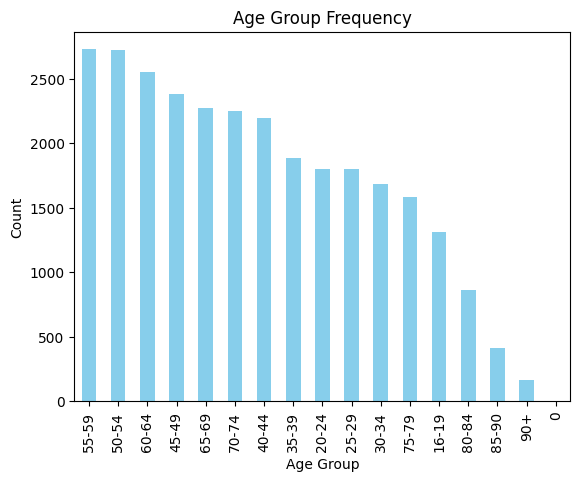

In [17]:
# Create a bar chart for age group counts
age_group_counts.plot(kind='bar', color='skyblue')  # You can customize the color and style
plt.title("Age Group Frequency")
plt.xlabel("Age Group")
plt.ylabel("Count")
plt.show()

In [18]:
# Filter out rows with age group '0' or zero-equivalent (NaN, None, etc.)
UKHLA_filtered = UKHLA[UKHLA['age_grouped_one'] != '0']  # Keep rows where age group is not '0'

print("Filtered DataFrame:")
print(UKHLA_filtered[['klm_dvage', 'age_grouped_one']])

Filtered DataFrame:
       klm_dvage age_grouped_one
0             63           60-64
1             43           40-44
2             35           35-39
3             57           55-59
4             60           60-64
...          ...             ...
28642         50           50-54
28643         75           75-79
28644         33           30-34
28645         66           65-69
28646         78           75-79

[28644 rows x 2 columns]


In [19]:
# Remove rows where 'klm_sclfsato' has negative values
UKHLA_cleaned = UKHLA_filtered[UKHLA_filtered['klm_sclfsato'] >= 0]  # Keep only non-negative values

print("Cleaned DataFrame:")
print(UKHLA_cleaned)

Cleaned DataFrame:
             pidp  pid    klm_hidp    k_hidp_x  l_hidp_x  m_hidp_x  klm_pno  \
0        68008847   -8    68013624         -14       -14  68013624        1   
1        68009527   -8    68020424         -14       -14  68020424        1   
2        68061288   -8    68020424         -14       -14  68020424        2   
3        68010887   -8    68027224         -14       -14  68027224        1   
4        68068082   -8    68027224         -14       -14  68027224        2   
...           ...  ...         ...         ...       ...       ...      ...   
28642  1651971690   -8  1637508020  1637508020       -14       -14        2   
28643  1651971730   -8  1637508020  1637508020       -14       -14        3   
28644  1652366050   -8  1637623620  1637623620       -14       -14        1   
28645  1639697692   -8  1637732420  1637732420       -14       -14        2   
28646  1653127650   -8  1637732420  1637732420       -14       -14        1   

       klm_wave_x  klm_childpno 

In [20]:
# Remove rows where 'klm_scghq1_dv' has negative values
UKHLA_cleaned = UKHLA_cleaned[UKHLA_cleaned['klm_scghq1_dv'] >= 0]  # Keep only non-negative values

print("Cleaned DataFrame:")
print(UKHLA_cleaned)

Cleaned DataFrame:
             pidp  pid    klm_hidp    k_hidp_x  l_hidp_x  m_hidp_x  klm_pno  \
0        68008847   -8    68013624         -14       -14  68013624        1   
1        68009527   -8    68020424         -14       -14  68020424        1   
2        68061288   -8    68020424         -14       -14  68020424        2   
3        68010887   -8    68027224         -14       -14  68027224        1   
4        68068082   -8    68027224         -14       -14  68027224        2   
...           ...  ...         ...         ...       ...       ...      ...   
28641  1651971650   -8  1637508020  1637508020       -14       -14        1   
28642  1651971690   -8  1637508020  1637508020       -14       -14        2   
28643  1651971730   -8  1637508020  1637508020       -14       -14        3   
28644  1652366050   -8  1637623620  1637623620       -14       -14        1   
28646  1653127650   -8  1637732420  1637732420       -14       -14        1   

       klm_wave_x  klm_childpno 

In [21]:
# Configure pandas to display all rows in the output
pd.set_option('display.max_rows', None)  # None means no limit on rows displayed

# Get the count of unique values in 'klm_scghq1_dv'
answer_counts = UKHLA_cleaned['klm_scghq1_dv'].value_counts()

print("Count of answers:")
print(answer_counts)

Count of answers:
klm_scghq1_dv
12.0    3638
6.0     3373
11.0    2491
7.0     2372
8.0     2177
9.0     2129
10.0    2099
13.0    1415
14.0    1023
15.0     855
16.0     681
17.0     630
18.0     504
20.0     488
19.0     463
5.0      400
21.0     373
22.0     360
23.0     319
24.0     309
25.0     189
4.0      167
26.0     151
27.0     137
28.0     114
3.0      113
29.0      94
31.0      84
30.0      82
36.0      79
32.0      76
0.0       76
2.0       71
33.0      66
1.0       63
34.0      59
35.0      52
Name: count, dtype: int64


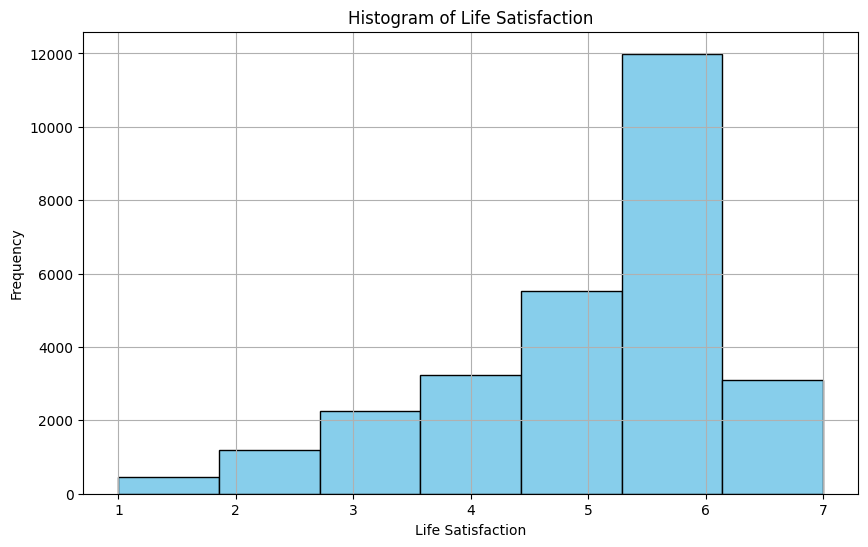

In [22]:
# Plot a histogram for 'klm_scghq1_dv'
plt.figure(figsize=(10, 6))  # Adjust the plot size
plt.hist(UKHLA_cleaned['klm_sclfsato'], bins=7, color='skyblue', edgecolor='black')  # Create the histogram
plt.xlabel('Life Satisfaction')  # Label for x-axis
plt.ylabel('Frequency')  # Label for y-axis
plt.title('Histogram of Life Satisfaction')  # Title for the plot
plt.grid(True)  # Add a grid for better readability

# Display the histogram
plt.show()

In [23]:
# Get value counts for 'klm_scghq1_dv'
value_counts = UKHLA_cleaned['klm_sclfsato'].value_counts()

value_counts  # Display the value counts

klm_sclfsato
6.0    11992
5.0     5530
4.0     3232
7.0     3101
3.0     2265
2.0     1191
1.0      461
Name: count, dtype: int64

In [24]:
median_life_satisfaction = UKHLA_cleaned['klm_sclfsato'].median()
mean_life_satisfaction = UKHLA_cleaned['klm_sclfsato'].mean()

median_life_satisfaction, mean_life_satisfaction

(6.0, 5.180577560132508)

In [25]:
# reverse variable direction
unique_values = sorted(UKHLA_cleaned['klm_scghq1_dv'].unique())
value_mapping = {original: len(unique_values) - i for i, original in enumerate(unique_values)}

print("Value Mapping:")
print(value_mapping)

Value Mapping:
{0.0: 37, 1.0: 36, 2.0: 35, 3.0: 34, 4.0: 33, 5.0: 32, 6.0: 31, 7.0: 30, 8.0: 29, 9.0: 28, 10.0: 27, 11.0: 26, 12.0: 25, 13.0: 24, 14.0: 23, 15.0: 22, 16.0: 21, 17.0: 20, 18.0: 19, 19.0: 18, 20.0: 17, 21.0: 16, 22.0: 15, 23.0: 14, 24.0: 13, 25.0: 12, 26.0: 11, 27.0: 10, 28.0: 9, 29.0: 8, 30.0: 7, 31.0: 6, 32.0: 5, 33.0: 4, 34.0: 3, 35.0: 2, 36.0: 1}


In [26]:
# Apply the mapping to 'klm_scghq1_dv'
UKHLA_cleaned['klm_scghq1_dv_reversed'] = UKHLA_cleaned['klm_scghq1_dv'].map(value_mapping)

print("Dataset with Reversed 'klm_scghq1_dv':")
print(UKHLA_cleaned[['klm_scghq1_dv', 'klm_scghq1_dv_reversed']])

Dataset with Reversed 'klm_scghq1_dv':
       klm_scghq1_dv  klm_scghq1_dv_reversed
0               12.0                      25
1               12.0                      25
2               12.0                      25
3               11.0                      26
4                9.0                      28
5                7.0                      30
6                8.0                      29
7               20.0                      17
8                6.0                      31
9               18.0                      19
10              17.0                      20
11               6.0                      31
12              35.0                       2
13               9.0                      28
14               8.0                      29
15               6.0                      31
16               8.0                      29
17              12.0                      25
18               8.0                      29
19              11.0                      26
20              

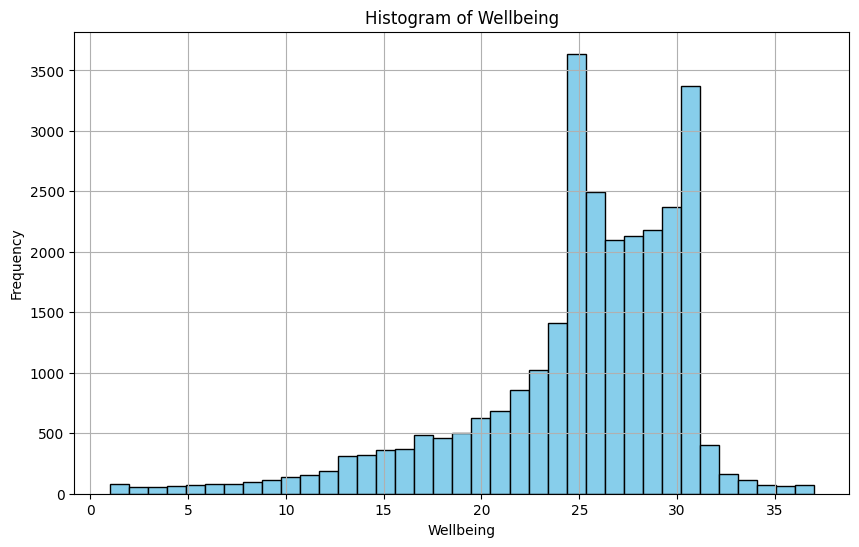

In [27]:
# Plot a histogram for 'klm_scghq1_dv'
plt.figure(figsize=(10, 6))  # Adjust the plot size
plt.hist(UKHLA_cleaned['klm_scghq1_dv_reversed'], bins=37, color='skyblue', edgecolor='black')  # Create the histogram
plt.xlabel('Wellbeing')  # Label for x-axis
plt.ylabel('Frequency')  # Label for y-axis
plt.title('Histogram of Wellbeing')  # Title for the plot
plt.grid(True)  # Add a grid for better readability

# Display the histogram
plt.show()

In [28]:
# Create a pivot table to get the mean wellbeing for each age group
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  # wellbeing
    index='age_grouped_one',  # Group by age group
    aggfunc='mean'  # Aggregate using the mean
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                 klm_sclfsato
age_grouped_one              
16-19                5.132091
20-24                5.039696
25-29                5.051445
30-34                5.094833
35-39                5.097964
40-44                5.056834
45-49                5.041631
50-54                5.027119
55-59                5.050094
60-64                5.110800
65-69                5.388040
70-74                5.513964
75-79                5.539846
80-84                5.583433
85-90                5.621212
90+                  5.540881


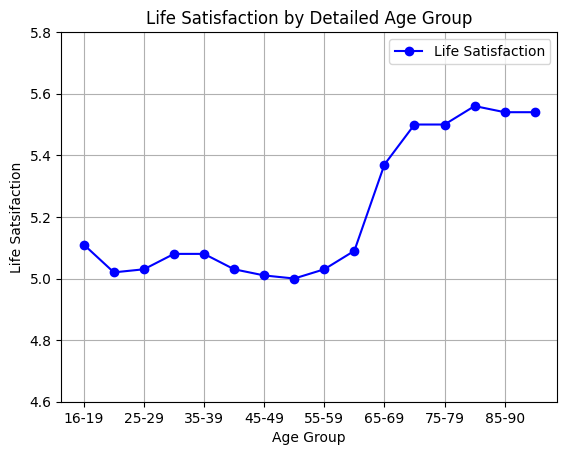

In [29]:
# Create a sample pivot table
data = {
    'Age Group': ['16-19', '20-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', '80-84', '85-90', '90+'],
    'Life Satisfaction': [5.11, 5.02, 5.03, 5.08, 5.08, 5.03, 5.01, 5.00, 5.03, 5.09, 5.37, 5.50, 5.50, 5.56, 5.54, 5.54]
}
pivot_table = pd.DataFrame(data)

# Plot the line plot
ax = pivot_table.plot(kind='line', x='Age Group', y='Life Satisfaction', marker='o', color='b') 
plt.ylim(4.6, 5.8)
plt.yticks([4.6, 4.8, 5.0, 5.2, 5.4, 5.6, 5.8])

plt.title("Life Satisfaction by Detailed Age Group")
plt.xlabel("Age Group")
plt.ylabel("Life Satsifaction")
plt.grid(True)  # Enable gridlines for better readability
plt.show()

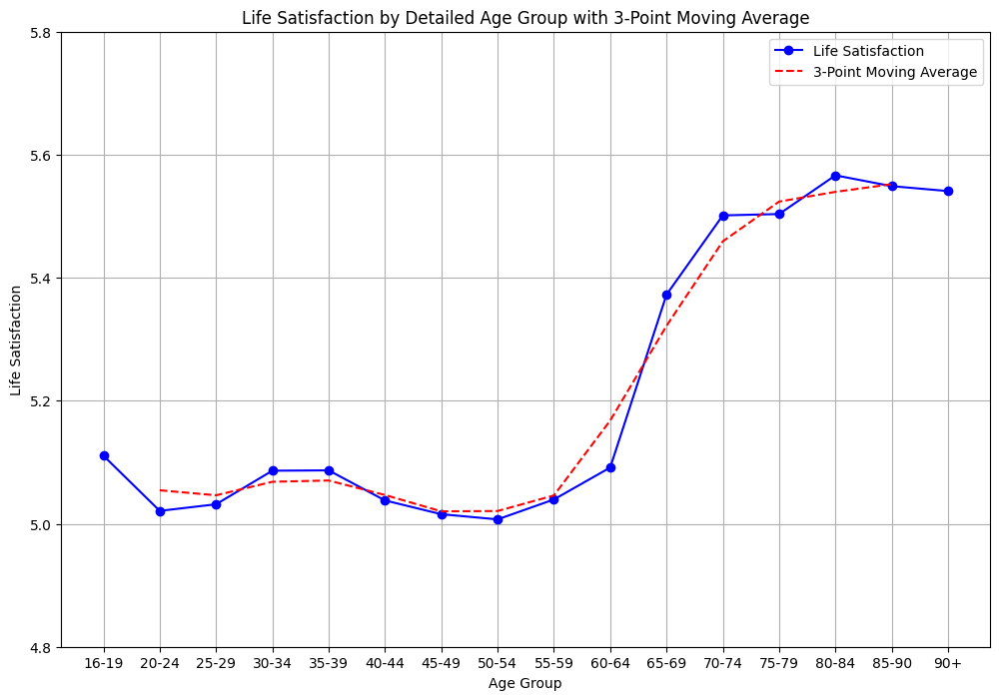

In [30]:
# Data from the pivot table
age_groups = ["16-19", "20-24", "25-29", "30-34", "35-39", "40-44", "45-49", "50-54", "55-59",
              "60-64", "65-69", "70-74", "75-79", "80-84", "85-90", "90+"]
life_satisfaction = [5.110662, 5.020967, 5.031700, 5.086270, 5.086813, 5.037957, 5.015551,
                     5.007137, 5.039503, 5.091417, 5.372531, 5.501349, 5.503519, 5.566467,
                     5.548872, 5.540881]

# Create a DataFrame
df = pd.DataFrame({
    "Age Group": age_groups,
    "Life Satisfaction": life_satisfaction
})

# Calculate the 3-point moving average
df["3-Point Moving Average"] = df["Life Satisfaction"].rolling(window=3, center=True).mean()

# Set plot size
plt.figure(figsize=(12, 8))  # Increase the size of the plot

# Plot the original data
plt.plot(df["Age Group"], df["Life Satisfaction"], "bo-", label="Life Satisfaction")

# Plot the 3-point moving average trend line
plt.plot(df["Age Group"], df["3-Point Moving Average"], "r--", label="3-Point Moving Average")

# Add plot elements
plt.xlabel("Age Group")
plt.ylabel("Life Satisfaction")
plt.title("Life Satisfaction by Detailed Age Group with 3-Point Moving Average")
plt.legend()
plt.grid(True)

# Set y-axis start point
plt.ylim(4.8, 5.8)  # Start at 4.6, auto-adjust upper limit

# Display the plot
plt.show()

In [31]:
# Create a pivot table to get the mean wellbeing for each age group
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_scghq1_dv_reversed',  # wellbeing
    index='age_grouped_one',  # Group by age group
    aggfunc='mean'  # Aggregate using the mean
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                 klm_scghq1_dv_reversed
age_grouped_one                        
16-19                         24.562399
20-24                         24.488616
25-29                         24.347399
30-34                         24.580547
35-39                         24.561365
40-44                         24.666980
45-49                         24.823938
50-54                         24.970998
55-59                         25.172881
60-64                         25.212000
65-69                         26.115558
70-74                         26.261261
75-79                         26.283419
80-84                         26.106843
85-90                         26.404040
90+                           26.069182


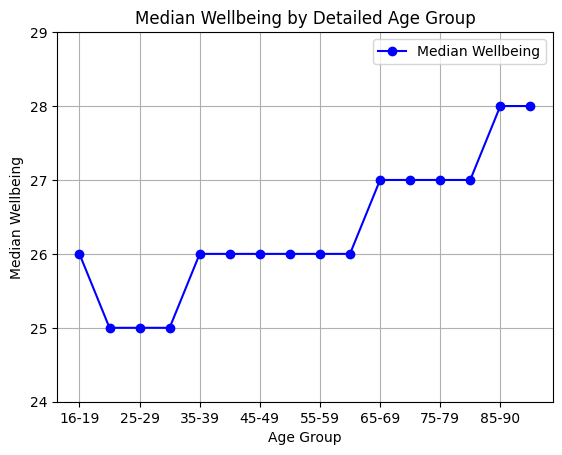

In [32]:
# Create a sample pivot table
data = {
    'Age Group': ['16-19', '20-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', '80-84', '85-90', '90+'],
    'Median Wellbeing': [26, 25, 25, 25, 26, 26, 26, 26, 26, 26, 27, 27, 27, 27, 28, 28]
}
pivot_table = pd.DataFrame(data)

# Plot the line plot
ax = pivot_table.plot(kind='line', x='Age Group', y='Median Wellbeing', marker='o', color='b') 
ax.set_ylim(24, 29)  # Set y-axis limits
ax.set_yticks([24, 25, 26, 27, 28, 29])  # Set y-axis ticks

plt.title("Median Wellbeing by Detailed Age Group")
plt.xlabel("Age Group")
plt.ylabel("Median Wellbeing")
plt.grid(True)  # Enable gridlines for better readability
plt.show()

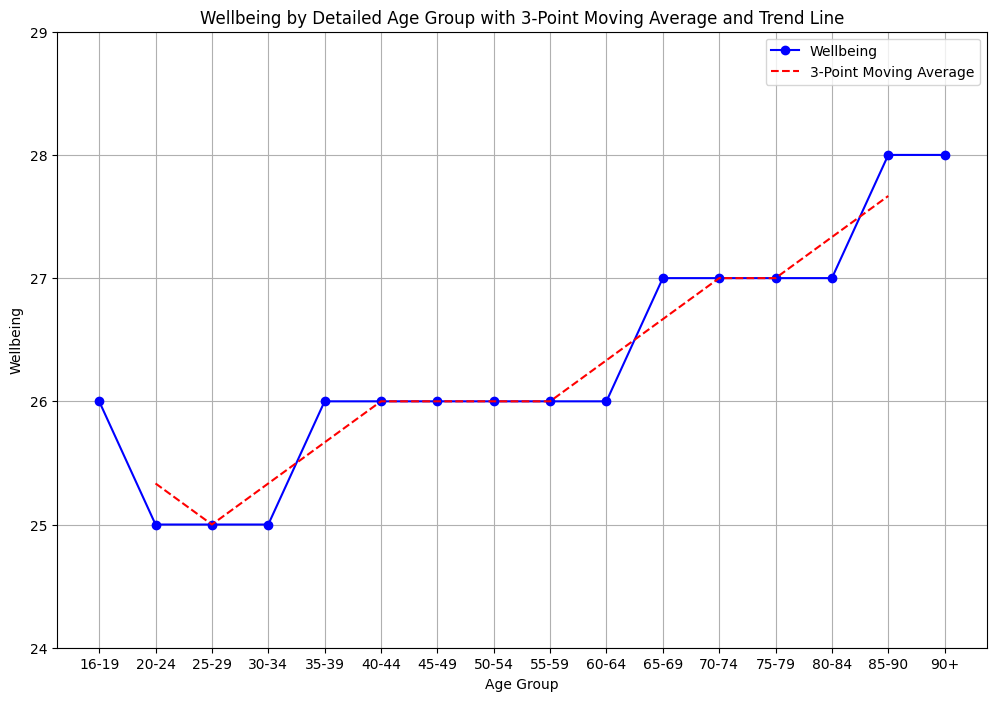

In [33]:
# Sample data for life satisfaction by age group
age_groups = ['16-19', '20-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', '80-84', '85-90', '90+']
wellbeing = [26, 25, 25, 25, 26, 26, 26, 26, 26, 26, 27, 27, 27, 27, 28, 28]

# Create a DataFrame
df = pd.DataFrame({
    "Age Group": age_groups,
    "Wellbeing": wellbeing
})

# Calculate the 3-point moving average
df["3-Point Moving Average"] = df["Wellbeing"].rolling(window=3, center=True).mean()

# Fit a linear trend line using polyfit
x = np.arange(len(age_groups))  # Convert age groups to numerical index
coefficients = np.polyfit(x, df["Wellbeing"], 1)  # Degree 1 for linear
polynomial = np.poly1d(coefficients)

# Create a range for the trend line
x_new = np.linspace(x[0], x[-1], 16)  # Densify the x-axis for smoothness
y_new = polynomial(x_new)  # Generate y-values using the trend

# Set plot size
plt.figure(figsize=(12, 8))  # Increase the size of the plot

# Plot the original data
plt.plot(df["Age Group"], df["Wellbeing"], "bo-", label="Wellbeing")

# Plot the 3-point moving average trend line
plt.plot(df["Age Group"], df["3-Point Moving Average"], "r--", label="3-Point Moving Average")

# Add plot elements
plt.xlabel("Age Group")
plt.ylabel("Wellbeing")
plt.title("Wellbeing by Detailed Age Group with 3-Point Moving Average and Trend Line")
plt.legend()
plt.grid(True)

# Set y-axis start point
plt.ylim(24, 29)  # Start at 4.6, auto-adjust upper limit

# Display the plot
plt.show()

In [34]:
# Define the conditions for each age group
conditions_grouped_two = [
    (UKHLA_cleaned['klm_dvage'] >= 16) & (UKHLA_cleaned['klm_dvage'] <= 35),
    (UKHLA_cleaned['klm_dvage'] >= 36) & (UKHLA_cleaned['klm_dvage'] <= 59),
    (UKHLA_cleaned['klm_dvage'] >= 60)
]

# Define the labels for these conditions
choices_grouped_two = [
    '16-35', '36-59', '60+'
]

# Create the new age_grouped_two column
UKHLA_cleaned['age_grouped_two'] = np.select(conditions_grouped_two, choices_grouped_two, default='Unknown')

# Optionally, check the first few entries to verify the new column
print(UKHLA_cleaned.head())

       pidp  pid  klm_hidp  k_hidp_x  l_hidp_x  m_hidp_x  klm_pno  klm_wave_x  \
0  68008847   -8  68013624       -14       -14  68013624        1          13   
1  68009527   -8  68020424       -14       -14  68020424        1          13   
2  68061288   -8  68020424       -14       -14  68020424        2          13   
3  68010887   -8  68027224       -14       -14  68027224        1          13   
4  68068082   -8  68027224       -14       -14  68027224        2          13   

   klm_childpno  klm_hhorig_x  ...  klm_nchoecd_dv  klm_nadoecd_dv  \
0            -8             1  ...             0.0             1.0   
1            -8             1  ...             2.0             2.0   
2            -8             1  ...             2.0             2.0   
3            -8             1  ...             0.0             2.0   
4            -8             1  ...             0.0             2.0   

   klm_ieqmoecd_dv  klm_tenure_dv  klm_fihhnegsei_if  klm_fihhmngrs_if  \
0              1.0

In [35]:
# Calculate the value counts for the 'age_grouped_two' column
age_grouped_two_counts = UKHLA_cleaned['age_grouped_two'].value_counts()

# Print the counts
print(age_grouped_two_counts)

age_grouped_two
36-59    11263
60+       9888
16-35     6621
Name: count, dtype: int64


In [36]:
# Create a pivot table to get the mean wellbeing for each age group
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_scghq1_dv_reversed',  # wellbeing
    index='age_grouped_two',  # Group by age group
    aggfunc='mean'  # Aggregate using the mean
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                 klm_scghq1_dv_reversed
age_grouped_two                        
16-35                         24.493732
36-59                         24.874545
60+                           25.956311


In [37]:
# Create a pivot table to get the median wellbeing for each age group
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  # wellbeing
    index='age_grouped_two',  # Group by age group
    aggfunc='median'  # Aggregate using the median
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                 klm_sclfsato
age_grouped_two              
16-35                     5.0
36-59                     5.0
60+                       6.0


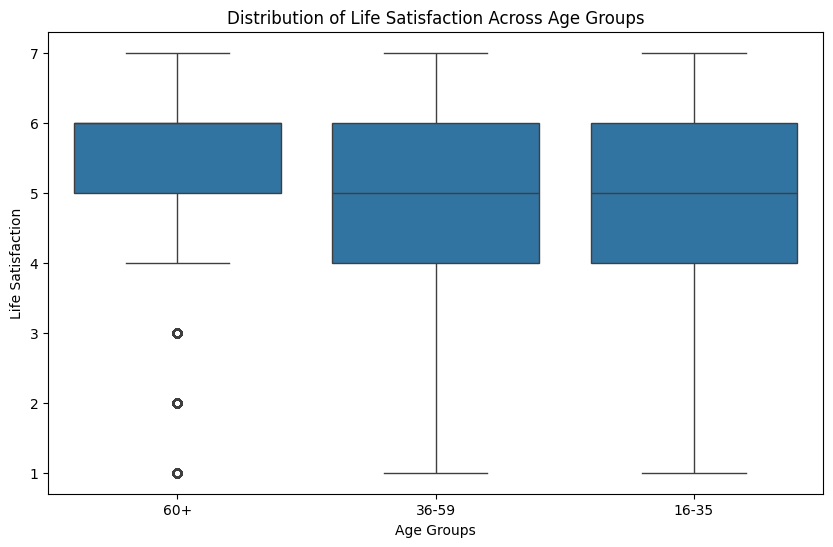

In [38]:
plt.figure(figsize=(10, 6))  # Set the figure size for better readability
sns.boxplot(x='age_grouped_two', y='klm_sclfsato', data=UKHLA_cleaned)
plt.title('Distribution of Life Satisfaction Across Age Groups')
plt.xlabel('Age Groups')
plt.ylabel('Life Satisfaction')
plt.show()

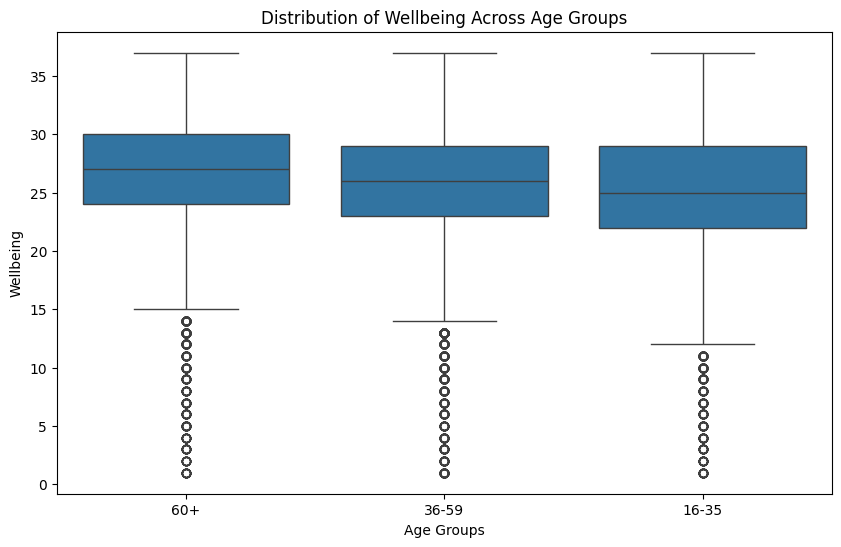

In [39]:
plt.figure(figsize=(10, 6))  # Set the figure size for better readability
sns.boxplot(x='age_grouped_two', y='klm_scghq1_dv_reversed', data=UKHLA_cleaned)
plt.title('Distribution of Wellbeing Across Age Groups')
plt.xlabel('Age Groups')
plt.ylabel('Wellbeing')
plt.show()

In [40]:
# Get value counts for 'klm_livewith'
value_counts = UKHLA_cleaned['klm_hhtype_dv_x'].value_counts()

# Display the value counts
print(value_counts)

klm_hhtype_dv_x
 8.0     5432
 19.0    4065
 6.0     2916
 11.0    2612
 20.0    2421
 3.0     2049
 2.0     1692
 10.0    1661
 12.0     941
 1.0      680
 17.0     632
 16.0     565
 22.0     523
 18.0     354
 5.0      351
 4.0      337
 21.0     328
 23.0     212
-14.0       1
Name: count, dtype: int64


In [41]:
# Step 1: Remove values less than zero
UKHLA_cleaned = UKHLA_cleaned[UKHLA_cleaned['klm_hhtype_dv_x'] >= 0]

# Step 2: Create a mapping dictionary for recoding
mapping_dict = {
    1.0: 1,
    2.0: 1,
    3.0: 1,
    4.0: 2,
    5.0: 2,
    6.0: 3,
    8.0: 3,
    10.0: 4,
    11.0: 4,
    12.0: 4,
    16.0: 5,
    17.0: 5,
    18.0: 5,
    19.0: 5,
    22.0: 5,
    23.0: 5,
    20.0: 6,
    21.0: 6
}

# Step 3: Recode the values using the mapping dictionary
UKHLA_cleaned['klm_hhtype_dv_recode'] = UKHLA_cleaned['klm_hhtype_dv_x'].map(mapping_dict)

In [42]:
# Get value counts for 'klm_livewith'
value_counts = UKHLA_cleaned['klm_hhtype_dv_recode'].value_counts()

# Display the value counts
print(value_counts)

klm_hhtype_dv_recode
3    8348
5    6351
4    5214
1    4421
6    2749
2     688
Name: count, dtype: int64


In [43]:
# Create a pivot table with 'klm_hhtype_dv_recode' and the mean life satisfaction
pivot_table = UKHLA_cleaned.pivot_table(values='klm_sclfsato', index='klm_hhtype_dv_recode', aggfunc='mean')

print(pivot_table)

                      klm_sclfsato
klm_hhtype_dv_recode              
1                         5.073739
2                         4.614826
3                         5.422137
4                         5.250671
5                         4.972288
6                         5.109131


In [44]:
# Create a cross-tabulation of household type and age groups
cross_tab = pd.crosstab(index=UKHLA_cleaned['klm_hhtype_dv_recode'], columns=UKHLA_cleaned['age_grouped_two'])

# Print the cross-tabulation
print(cross_tab)

age_grouped_two       16-35  36-59   60+
klm_hhtype_dv_recode                    
1                       667   1197  2557
2                       266    406    16
3                       851   2114  5383
4                      1462   3673    79
5                      2193   2502  1656
6                      1182   1370   197


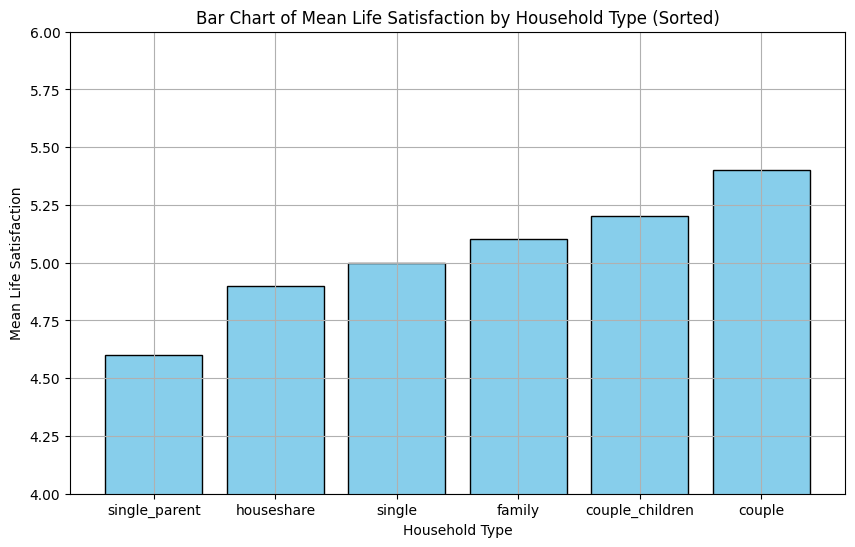

In [45]:
# Sample pivot table with mean life satisfaction by household type
pivot_table = pd.DataFrame({
    'Household Type': ["single", "single_parent", "couple", "couple_children", "houseshare", "family"],
    'Mean Life Satisfaction': [5.0, 4.6, 5.4, 5.2, 4.9, 5.1]
})

# Sort the pivot table by mean life satisfaction
sorted_pivot_table = pivot_table.sort_values(by='Mean Life Satisfaction', ascending=True)

# Create a bar chart
plt.figure(figsize=(10, 6))  # Adjust plot size
plt.bar(sorted_pivot_table['Household Type'], sorted_pivot_table['Mean Life Satisfaction'], color='skyblue', edgecolor='black')  # Create bar chart
plt.xlabel('Household Type')  # Label for x-axis
plt.ylabel('Mean Life Satisfaction')  # Label for y-axis
plt.title('Bar Chart of Mean Life Satisfaction by Household Type (Sorted)')  # Title for the plot
plt.ylim(4, 6)  # Set y-axis limits between 4 and 7
plt.grid(True)  # Add grid for readability

# Display the bar chart
plt.show()  # Show the bar chart

Country of Residence

In [46]:
country_counts = UKHLA_cleaned['klm_country_x'].value_counts()
print(country_counts)

# England 1	
# Wales 2	
# Scotland 3	
# Northern Ireland 4	
# Missing 9

klm_country_x
 1.0    21794
 3.0     2389
 4.0     1802
 2.0     1778
-9.0        8
Name: count, dtype: int64


In [47]:
# Step 1: Remove values less than zero
UKHLA_cleaned = UKHLA_cleaned[UKHLA_cleaned['klm_country_x'] >= 0]

In [48]:
# Create a pivot table to get the mean wellbeing for each contry
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='klm_country_x',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
               klm_sclfsato
klm_country_x              
1.0                5.158713
2.0                5.171541
3.0                5.241105
4.0                5.374029


Urban or Rural

In [49]:
ur_counts = UKHLA_cleaned['klm_urban_dv_x'].value_counts()
print(ur_counts)

# 1 Urban
# 2 Rural

klm_urban_dv_x
1.0    20585
2.0     7178
Name: count, dtype: int64


In [50]:
# Create a pivot table to get the mean wellbeing for urban/rural
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='klm_urban_dv_x',  
    aggfunc='median' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                klm_sclfsato
klm_urban_dv_x              
1.0                      6.0
2.0                      6.0


Cares for another in household

In [51]:
cares_counts = UKHLA_cleaned['klm_aidhh'].value_counts()
print(cares_counts)

klm_aidhh
 2    21419
-8     4381
 1     1917
-2       29
-1       13
-9        4
Name: count, dtype: int64


In [52]:
# Replace -8 with 2 in the 'klm_aidhh' column
UKHLA_cleaned['cares_for'] = UKHLA_cleaned['klm_aidhh'].replace(-8, 2)

# Calculate the value counts again to check the new distribution
new_cares_counts = UKHLA_cleaned['cares_for'].value_counts()

# Print the new value counts
print(new_cares_counts)

cares_for
 2    25800
 1     1917
-2       29
-1       13
-9        4
Name: count, dtype: int64


In [53]:
# Step 1: Remove values less than zero
UKHLA_cleaned = UKHLA_cleaned[UKHLA_cleaned['cares_for'] >= 0]

In [54]:
# Create a pivot table to get the mean wellbeing for cares for 
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='cares_for',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
           klm_sclfsato
cares_for              
1              4.809598
2              5.209496


Cares for a non-resident

In [55]:
cares_counts_two = UKHLA_cleaned['klm_aidxhh'].value_counts()
print(cares_counts_two)

# Yes 1
# No 2

klm_aidxhh
 2    24904
 1     2790
-2       12
-1       11
Name: count, dtype: int64


In [56]:
# Step 1: Remove values less than zero
UKHLA_cleaned = UKHLA_cleaned[UKHLA_cleaned['klm_aidxhh'] >= 0]

In [57]:
# Create a pivot table to get the mean wellbeing for urban/rural
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='klm_aidxhh',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
            klm_sclfsato
klm_aidxhh              
1               5.084946
2               5.193383


New variable: caring for anyone, in or out house

In [58]:
def determine_value(row):
    if row['klm_aidxhh'] == 1 or row['cares_for'] == 1:
        return 1
    elif row['klm_aidxhh'] == 2 and row['cares_for'] == 2:
        return 2
    else:
        return 0  

# Apply the function across rows
UKHLA_cleaned['carer_all'] = UKHLA_cleaned.apply(determine_value, axis=1)

# Display the first few rows to verify the new variable
print(UKHLA_cleaned[['klm_aidxhh', 'cares_for', 'carer_all']])

       klm_aidxhh  cares_for  carer_all
0               2          2          2
1               2          2          2
2               2          2          2
3               2          2          2
4               2          2          2
5               2          2          2
6               2          2          2
7               2          2          2
8               2          2          2
9               2          2          2
10              2          2          2
11              2          2          2
12              2          2          2
13              2          2          2
14              2          2          2
15              2          2          2
16              2          2          2
17              2          2          2
18              2          2          2
19              2          2          2
20              2          2          2
21              2          2          2
22              1          2          1
23              1          2          1


In [59]:
carer_all = UKHLA_cleaned['carer_all'].value_counts()
print(carer_all)

carer_all
2    23380
1     4314
Name: count, dtype: int64


In [60]:
# Create a pivot table to get the mean wellbeing for urban/rural
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='carer_all',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
           klm_sclfsato
carer_all              
1              5.000464
2              5.216039


Income

In [61]:
income_count = UKHLA_cleaned['klm_fimnnet_dv'].value_counts()
print(income_count)

klm_fimnnet_dv
 0.000000         1613
 1300.000000       133
 1500.000000       115
 2000.000000       105
 1200.000000       102
 1000.000000        98
 1600.000000        97
 1400.000000        95
 1800.000000        91
 1700.000000        90
 2200.000000        77
 2500.000000        75
 2100.000000        70
 2300.000000        66
 91.650002          63
 3000.000000        57
 2400.000000        54
 1900.000000        54
 1733.329956        51
 650.000000         51
 1100.000000        50
 152.320007         50
 1950.000000        48
 2600.000000        47
 433.329987         45
 1083.329956        44
 1516.670044        44
 1250.000000        43
 2166.669922        42
 1750.000000        41
 2800.000000        36
 500.000000         36
 2700.000000        36
 866.669983         34
 8.330000           33
 800.000000         33
 750.000000         32
 3500.000000        32
 1408.329956        31
 325.000000         30
 1625.000000        28
 758.330017         28
 1650.000000       

In [62]:
# Get the minimum value
min_value = UKHLA_cleaned['klm_fimnnet_dv'].min()

# Get the maximum value
max_value = UKHLA_cleaned['klm_fimnnet_dv'].max()

# Print the minimum and maximum values
print(f"The lowest value in the 'klm_fimnnet_dv' column is {min_value}")
print(f"The highest value in the 'klm_fimnnet_dv' column is {max_value}")

The lowest value in the 'klm_fimnnet_dv' column is -10749.25977
The highest value in the 'klm_fimnnet_dv' column is 173485.6406


In [63]:
# Assuming UKHLA_cleaned is already loaded into your environment
# Filter to find values lower than 0
negative_values = UKHLA_cleaned[UKHLA_cleaned['klm_fimnnet_dv'] < 0]['klm_fimnnet_dv']

# Print the negative values
print("Values lower than 0 in the 'klm_fimnnet_dv' column:")
print(negative_values)

Values lower than 0 in the 'klm_fimnnet_dv' column:
2047     -1247.050049
2658      -812.299988
4644        -5.840000
5309      -425.440002
6292    -10749.259770
9448      -525.390015
10716    -1636.359985
11322     -288.529999
11633     -464.119995
14916    -4584.390137
19494     -566.469971
20352     -169.169998
20762    -2019.510010
24312     -496.850006
24681      -74.000000
25173     -505.250000
26930     -550.510010
27625    -1273.339966
Name: klm_fimnnet_dv, dtype: float64


In [64]:
# Step 1: Remove values less than zero
UKHLA_cleaned = UKHLA_cleaned[UKHLA_cleaned['klm_fimnnet_dv'] >= 0]

In [65]:
# Calculate the mean income
mean_income = UKHLA_cleaned['klm_fimnnet_dv'].mean()

# Calculate the median income
median_income = UKHLA_cleaned['klm_fimnnet_dv'].median()

# Print the mean and median incomes
print(f"Mean income: {mean_income}")
print(f"Median income: {median_income}")

Mean income: 1740.4372126774792
Median income: 1493.494995


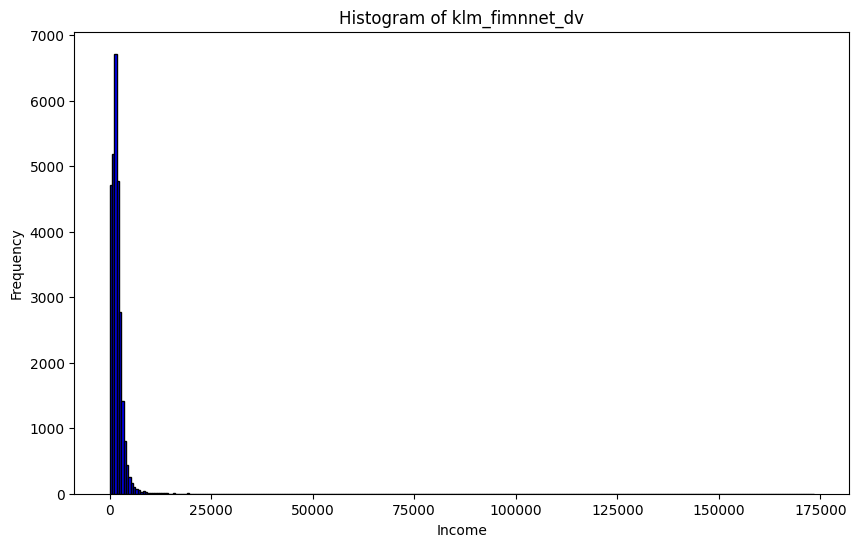

In [66]:
# Set up the figure size and resolution
plt.figure(figsize=(10, 6), dpi=100)

# Create the histogram
plt.hist(UKHLA_cleaned['klm_fimnnet_dv'].dropna(), bins=300, color='blue', edgecolor='black')  # You can adjust the number of bins and color

# Adding title and labels
plt.title('Histogram of klm_fimnnet_dv')
plt.xlabel('Income')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [67]:
# Create a new column 'income_category'
UKHLA_cleaned['income_category'] = np.where(UKHLA_cleaned['klm_fimnnet_dv'] > mean_income, 2, 1)

In [68]:
# Print the first few rows of the DataFrame to verify the new column
print(UKHLA_cleaned[['klm_fimnnet_dv', 'income_category']].head())

   klm_fimnnet_dv  income_category
0     2420.000000                2
1     2028.670044                2
2      535.440002                1
3     1547.000000                1
4     1927.790039                2


In [69]:
income_category = UKHLA_cleaned['income_category'].value_counts()
print(income_category)

income_category
1    16658
2    11018
Name: count, dtype: int64


In [70]:
# Create a pivot table to get the mean wellbeing for income
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='income_category',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                 klm_sclfsato
income_category              
1                    5.094909
2                    5.315393


In [71]:
# Create a pivot table to get the mean wellbeing for income
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_scghq1_dv_reversed',  
    index='income_category',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                 klm_scghq1_dv_reversed
income_category                        
1                             24.883960
2                             25.614631


In [72]:
# Create a new column 'income_category'
UKHLA_cleaned['income_category_median'] = np.where(UKHLA_cleaned['klm_fimnnet_dv'] > median_income, 2, 1)

In [73]:
income_category_median = UKHLA_cleaned['income_category_median'].value_counts()
print(income_category_median)

income_category_median
2    13838
1    13838
Name: count, dtype: int64


In [74]:
# Create a pivot table to get the mean wellbeing for income
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='income_category_median',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                        klm_sclfsato
income_category_median              
1                           5.089536
2                           5.275835


In [75]:
# Create a pivot table to get the mean wellbeing for income
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_scghq1_dv_reversed',  
    index='income_category_median',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                        klm_scghq1_dv_reversed
income_category_median                        
1                                    24.833213
2                                    25.516476


Other satisfaction variables

In [76]:
job_satisfaction = UKHLA_cleaned['klm_jbsat'].value_counts()
print(job_satisfaction)

klm_jbsat
-8.0    12529
 6.0     6471
 5.0     3320
 7.0     2525
 4.0     1168
 3.0     1016
 2.0      429
 1.0      184
-2.0       24
-1.0       10
Name: count, dtype: int64


In [77]:
# Create a pivot table to get the mean wellbeing for job satsifaction
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='klm_jbsat',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
           klm_sclfsato
klm_jbsat              
-8.0           5.157475
-2.0           4.750000
-1.0           5.500000
 1.0           3.961957
 2.0           4.102564
 3.0           4.466535
 4.0           4.626712
 5.0           4.995482
 6.0           5.425127
 7.0           5.753267


In [78]:
# Create a pivot table to get the mean wellbeing for leisure time satisfaction
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='klm_sclfsat7',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
              klm_sclfsato
klm_sclfsat7              
-2.0              5.600000
-1.0              3.875000
 1.0              2.918879
 2.0              3.580282
 3.0              4.454693
 4.0              4.342289
 5.0              5.289068
 6.0              5.730409
 7.0              6.062105


In [79]:
# Create a pivot table to get the mean wellbeing for health satisfaction
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='klm_sclfsat1',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
              klm_sclfsato
klm_sclfsat1              
-2.0              6.000000
-1.0              6.000000
 1.0              3.145089
 2.0              3.861024
 3.0              4.469357
 4.0              4.549616
 5.0              5.221005
 6.0              5.768788
 7.0              6.314771


In [80]:
# Create a pivot table to get the mean wellbeing for income satisfaction
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsato',  
    index='klm_sclfsat2',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
              klm_sclfsato
klm_sclfsat2              
-2.0              5.636364
-1.0              5.680000
 1.0              2.936306
 2.0              3.616429
 3.0              4.269285
 4.0              4.503584
 5.0              5.228344
 6.0              5.750537
 7.0              6.134395


Satsifaction with health - cross tabulations

In [81]:
# Create a pivot table to get the mean wellbeing for health satisfaction
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsat1',  
    index='age_grouped_one',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                 klm_sclfsat1
age_grouped_one              
16-19                5.254279
20-24                5.114706
25-29                4.966279
30-34                4.904151
35-39                4.872928
40-44                4.809434
45-49                4.770906
50-54                4.727238
55-59                4.723461
60-64                4.603690
65-69                4.772277
70-74                4.813345
75-79                4.799742
80-84                4.703125
85-90                4.756345
90+                  4.566038


Satisfaction with leisure time - crosstabs

In [82]:
# Create a pivot table to get the mean wellbeing for leisure time satisfaction
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsat7',  
    index='age_grouped_one',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                 klm_sclfsat7
age_grouped_one              
16-19                5.185004
20-24                4.888824
25-29                4.693023
30-34                4.491453
35-39                4.435912
40-44                4.442925
45-49                4.596254
50-54                4.743861
55-59                4.851152
60-64                5.144805
65-69                5.672817
70-74                5.846709
75-79                5.905988
80-84                5.945913
85-90                6.106599
90+                  5.993711


Satisfaction with income - cross tabs

In [83]:
# Create a pivot table to get the mean wellbeing for income satisfaction
pivot_table = UKHLA_cleaned.pivot_table(
    values='klm_sclfsat2',  
    index='age_grouped_one',  
    aggfunc='mean' 
)

print("Pivot Table:")
print(pivot_table) 

Pivot Table:
                 klm_sclfsat2
age_grouped_one              
16-19                5.195599
20-24                4.883529
25-29                4.750000
30-34                4.768620
35-39                4.755249
40-44                4.760849
45-49                4.689460
50-54                4.757839
55-59                4.902153
60-64                4.910148
65-69                5.287579
70-74                5.430568
75-79                5.500322
80-84                5.623798
85-90                5.741117
90+                  5.899371


Pivot of Satsifaction Variables

In [84]:
UKHLA_cleaned = UKHLA_cleaned.rename(columns={
    'klm_sclfsat2': 'income_satisfaction',
    'klm_sclfsat1': 'health_satisfaction',
    'klm_sclfsato': 'life_satisfaction',
    'klm_sclfsat7': 'leisure_time_satisfaction'
})

In [85]:
pivot_table = UKHLA_cleaned.pivot_table(
    values=['income_satisfaction', 'health_satisfaction', 'leisure_time_satisfaction', 'life_satisfaction'],
    index='age_grouped_one',
    aggfunc='mean'
)

In [86]:
# Define a custom color palette
colors = ['#6baed6', '#fd8d3c', '#74c476', '#9e9ac8'] 

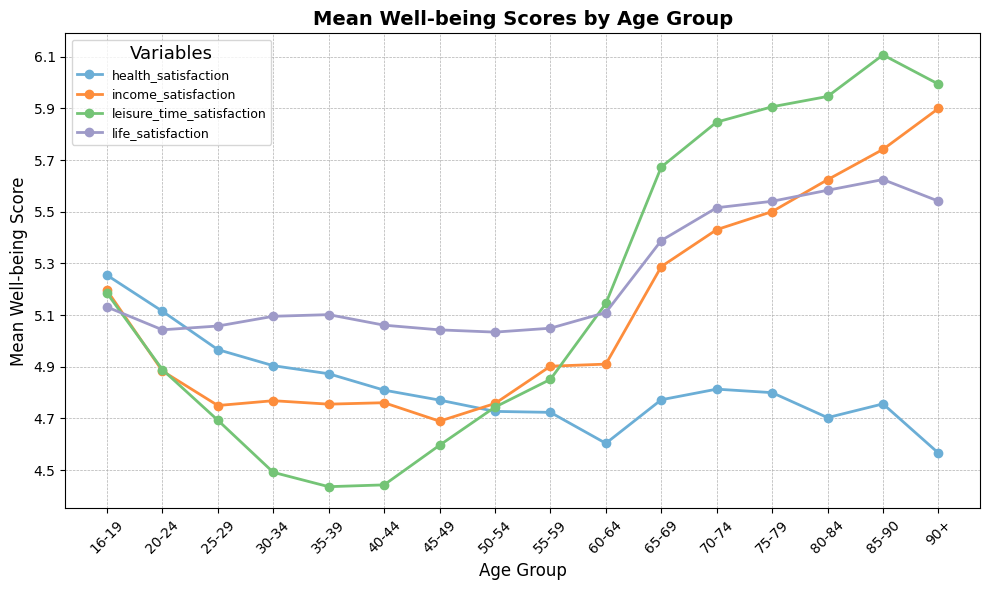

In [87]:
# Plotting the line graph with the custom color palette
plt.figure(figsize=(10, 6))
for i, column in enumerate(pivot_table.columns):
    plt.plot(pivot_table.index, pivot_table[column], marker='o', linewidth=2, label=column, color=colors[i])

plt.title('Mean Well-being Scores by Age Group', fontsize=14, fontweight='bold')
plt.xlabel('Age Group', fontsize=12)
plt.ylabel('Mean Well-being Score', fontsize=12)
plt.xticks(rotation=45)
plt.yticks(np.arange(4.5, 6.3, 0.2))  # Adjust the y-ticks for better granularity
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(title='Variables', fontsize=9, title_fontsize='13', loc='upper left')

# Enhance overall legibility
plt.gca().tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout()  # Adjust layout to make room for label

# Show the plot
plt.show()

We have explored the data-set as a whole. We want to create the random forest with three different age groups. This means we ideally will make three subsetted datasets for each age group, and then we will explore the variables within this groups. 

In [88]:
answer_counts = UKHLA_one['klm_dvage'].value_counts()

print("Count of answers:")
print(answer_counts)

Count of answers:
klm_dvage
 56     612
 53     572
 55     557
 59     554
 52     551
 51     547
 61     543
 60     535
 50     534
 54     520
 58     518
 62     518
 47     512
 49     499
 74     494
 57     488
 73     486
 68     485
 63     481
 48     477
 64     475
 46     468
 65     466
 40     458
 41     458
 66     453
 72     451
 67     448
 43     438
 44     427
 45     426
 69     425
 42     418
 71     411
 70     409
 37     407
 39     394
 38     389
 36     386
 75     383
 21     372
 28     371
 27     370
 25     363
 20     363
 22     360
 23     358
 76     356
 26     355
 24     352
 31     348
 18     348
 29     345
 17     341
 34     340
 30     338
 19     336
 32     334
 33     328
 77     318
 35     314
 16     287
 78     278
 79     252
 80     231
 81     202
 82     169
 83     144
 84     118
 86     100
 85      99
 88      81
 87      71
 89      62
 90      42
 91      39
 93      26
 92      25
 95      11
 94       8
 96       5


In [89]:
# Remove rows where age  has negative values
UKHLA_one = UKHLA_one[UKHLA_one['klm_dvage'] >= 0] 

In [90]:
# Filter the DataFrame to include only those entries where age is between 16 and 35
UKHLA_16_35 = UKHLA_one[(UKHLA_one['klm_dvage'] >= 60) & (UKHLA_one['klm_dvage'] <= 200)]

In [91]:
answer_counts = UKHLA_16_35['klm_dvage'].value_counts()

print("Count of answers:")
print(answer_counts)

Count of answers:
klm_dvage
61     543
60     535
62     518
74     494
73     486
68     485
63     481
64     475
65     466
66     453
72     451
67     448
69     425
71     411
70     409
75     383
76     356
77     318
78     278
79     252
80     231
81     202
82     169
83     144
84     118
86     100
85      99
88      81
87      71
89      62
90      42
91      39
93      26
92      25
95      11
94       8
96       5
98       4
97       3
99       2
101      1
100      1
Name: count, dtype: int64


LIFE SATISFACTION

In [92]:
# Remove rows where 'klm_sclfsato' has negative values
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_sclfsato'] >= 0]  # Keep only non-negative values

In [93]:
# Get value counts for the 'klm_sclfsato' column
sclfsato_value_counts = UKHLA_16_35['klm_sclfsato'].value_counts()

# Sort the value counts if needed (optional, depending on your analysis needs)
sorted_sclfsato_value_counts = sclfsato_value_counts.sort_index()

# Print the value counts for 'klm_sclfsato'
print(sorted_sclfsato_value_counts)

klm_sclfsato
1.0     136
2.0     356
3.0     653
4.0     956
5.0    1567
6.0    4819
7.0    1478
Name: count, dtype: int64


In [94]:
# Calculate the median of the 'klm_sclfsato' column
sclfsato_median = UKHLA_16_35['klm_sclfsato'].median()

# Calculate the mean of the 'klm_sclfsato' column
sclfsato_mean = UKHLA_16_35['klm_sclfsato'].mean()

# Print the median and mean values
print(f"Median of life satisfaction scores: {sclfsato_median}")
print(f"Mean of life satisfaction scores: {sclfsato_mean}")

Median of life satisfaction scores: 6.0
Mean of life satisfaction scores: 5.391470145509283


In [95]:
# Categorize life satisfaction scores into two groups based on the median
UKHLA_16_35['satisfaction_category'] = UKHLA_16_35['klm_sclfsato'].apply(lambda x: 'At or Below Median' if x <= 5 else 'Above Median')

# Get value counts for the new categorical groups
satisfaction_counts = UKHLA_16_35['satisfaction_category'].value_counts()

# Print the counts of each category
print(satisfaction_counts)

satisfaction_category
Above Median          6297
At or Below Median    3668
Name: count, dtype: int64


In [96]:
# Define the bins and labels for the categorization
bins = [0, 3, 5, 7]  # This includes the right edge, so 0-3, 4-5, 6-7
labels = ['Low', 'Medium', 'High']

# Categorize the life satisfaction scores using pd.cut
UKHLA_16_35['satisfaction_level'] = pd.cut(UKHLA_16_35['klm_sclfsato'], bins=bins, labels=labels, include_lowest=True)

# Check the value counts for each category to confirm the distribution
print(UKHLA_16_35['satisfaction_level'].value_counts())


satisfaction_level
High      6297
Medium    2523
Low       1145
Name: count, dtype: int64


How well would you say you yourself are managing financially these days? Would you say you are...

In [97]:
# Remove rows where 'klm_sclfsato' has negative values
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_finnow'] >= 0]  # Keep only non-negative values

In [98]:
# Get value counts for the 'klm_sclfsato' column
finances_now_counts = UKHLA_16_35['klm_finnow'].value_counts()

# Sort the value counts if needed (optional, depending on your analysis needs)
finances_now_counts = finances_now_counts.sort_index()

# Print the value counts for 'klm_sclfsato'
print(finances_now_counts)

klm_finnow
1.0    4344
2.0    4035
3.0    1315
4.0     195
5.0      58
Name: count, dtype: int64


HEALTH - Do you have any long-standing physical or mental impairment, illness or disability?

In [99]:
# Get value counts for the 'klm_sclfsato' column
health_value_counts = UKHLA_16_35['klm_health'].value_counts()

# Sort the value counts if needed (optional, depending on your analysis needs)
health_value_counts = health_value_counts.sort_index()

# Print the value counts for 'klm_sclfsato'
print(health_value_counts)

klm_health
-2       8
-1       6
 1    4516
 2    5417
Name: count, dtype: int64


In [100]:
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_health'] >= 0]  # Keep only non-negative values

In [101]:
# Recoding the values: 1 becomes 0 and 2 becomes 1.
recoded_data = UKHLA_16_35['klm_health'].replace({1: 0, 2: 1})

# Replacing the old 'klm_heatch' column with the recoded data
UKHLA_16_35.loc[UKHLA_16_35['klm_health'] >= 0, 'klm_health'] = recoded_data

SATSIFACTION WITH HEALTH

In [102]:
# Remove rows where 'klm_sclfsato' has negative values
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_sclfsat1'] >= 0]  # Keep only non-negative values

In [103]:
# Get value counts for the 'klm_sclfsato' column
health_satisfaction_value_counts = UKHLA_16_35['klm_sclfsat1'].value_counts()

# Sort the value counts if needed (optional, depending on your analysis needs)
health_satisfaction_value_counts = health_satisfaction_value_counts.sort_index()

# Print the value counts for 'klm_sclfsato'
print(health_satisfaction_value_counts)

klm_sclfsat1
1.0     402
2.0     738
3.0    1526
4.0    1078
5.0    1690
6.0    3736
7.0     760
Name: count, dtype: int64


SATISFACTION WITH LEISURE TIME

In [104]:
# Remove rows where 'klm_sclfsato' has negative values
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_sclfsat7'] >= 0]  # Keep only non-negative values

In [105]:
# Get value counts for the 'klm_sclfsato' column
leisure_satisfaction_value_counts = UKHLA_16_35['klm_sclfsat7'].value_counts()

# Sort the value counts if needed (optional, depending on your analysis needs)
leisure_satisfaction_value_counts = leisure_satisfaction_value_counts.sort_index()

# Print the value counts for 'klm_sclfsato'
print(leisure_satisfaction_value_counts)

klm_sclfsat7
1.0     198
2.0     261
3.0     473
4.0    1084
5.0    1214
6.0    3214
7.0    3476
Name: count, dtype: int64


INCOME

In [106]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_fimnnet_dv'] >= 0]

In [107]:
# Using .shape to get the number of rows, which represent the instances
num_instances = UKHLA_16_35.shape[0]

# Alternatively, using len() to get the number of rows
num_instances_len = len(UKHLA_16_35)

# Print the number of instances
print("Number of instances left in the DataFrame:", num_instances)
print("Number of instances using len():", num_instances_len)

Number of instances left in the DataFrame: 9918
Number of instances using len(): 9918


In [108]:
# Step 1: Calculate the annual income by multiplying the monthly income by 12
UKHLA_16_35['log_klm_fimnnet_dv'] = UKHLA_16_35['klm_fimnnet_dv'] * 12

# Step 2: Calculate the logarithm of the annual income to create a new variable
UKHLA_16_35['log_individual_annual_income'] = np.log(UKHLA_16_35['log_klm_fimnnet_dv'])

# Print out the new columns to verify
print(UKHLA_16_35[['klm_fihhmnlabnet_dv', 'klm_fimnnet_dv', 'log_individual_annual_income']].head())

    klm_fihhmnlabnet_dv  klm_fimnnet_dv  log_individual_annual_income
0           1334.000000     2420.000000                     10.276429
4           3474.790039     1927.790039                     10.049036
8              0.000000     1662.910034                      9.901231
10             0.000000     3998.669922                     10.778624
14           606.669983     1823.329956                      9.993326


c:\Users\annal\OneDrive\Dokumente\Year Two\Dissertation\Coding_UKHLA\dissertation\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


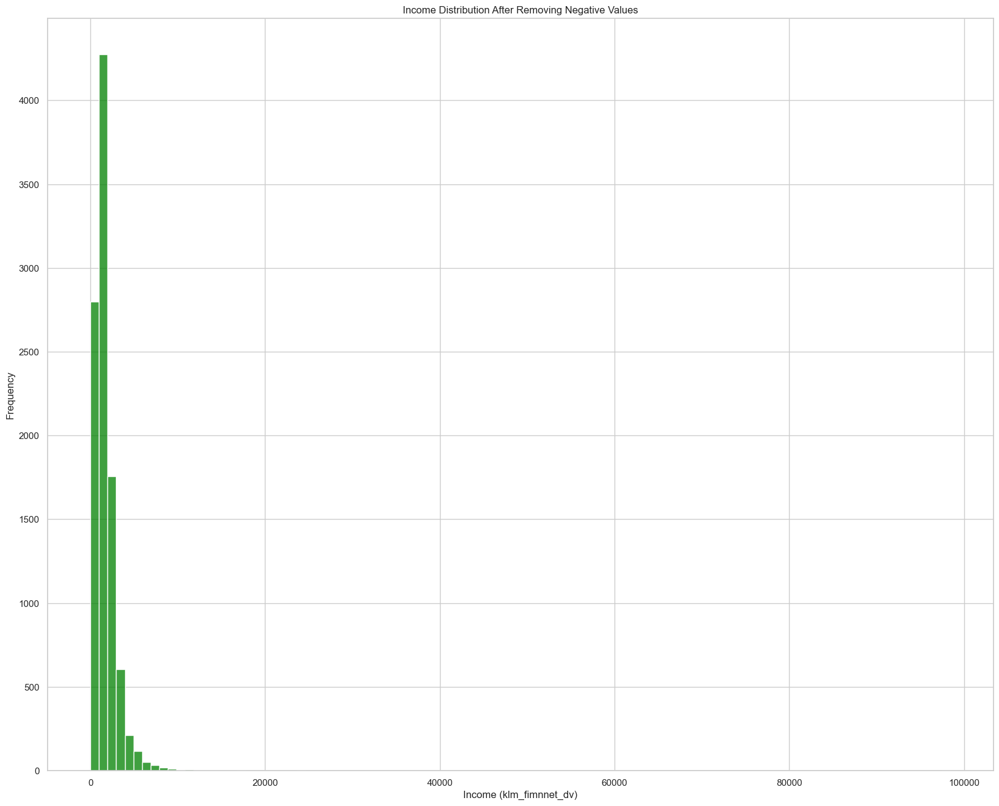

In [109]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plot
sns.set(style="whitegrid")

# Create a histogram for the filtered income data
plt.figure(figsize=(20, 16))
sns.histplot(UKHLA_16_35['klm_fimnnet_dv'], bins=100, kde=False, color='green')  # KDE (Kernel Density Estimate) is set to False
plt.title('Income Distribution After Removing Negative Values')
plt.xlabel('Income (klm_fimnnet_dv)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

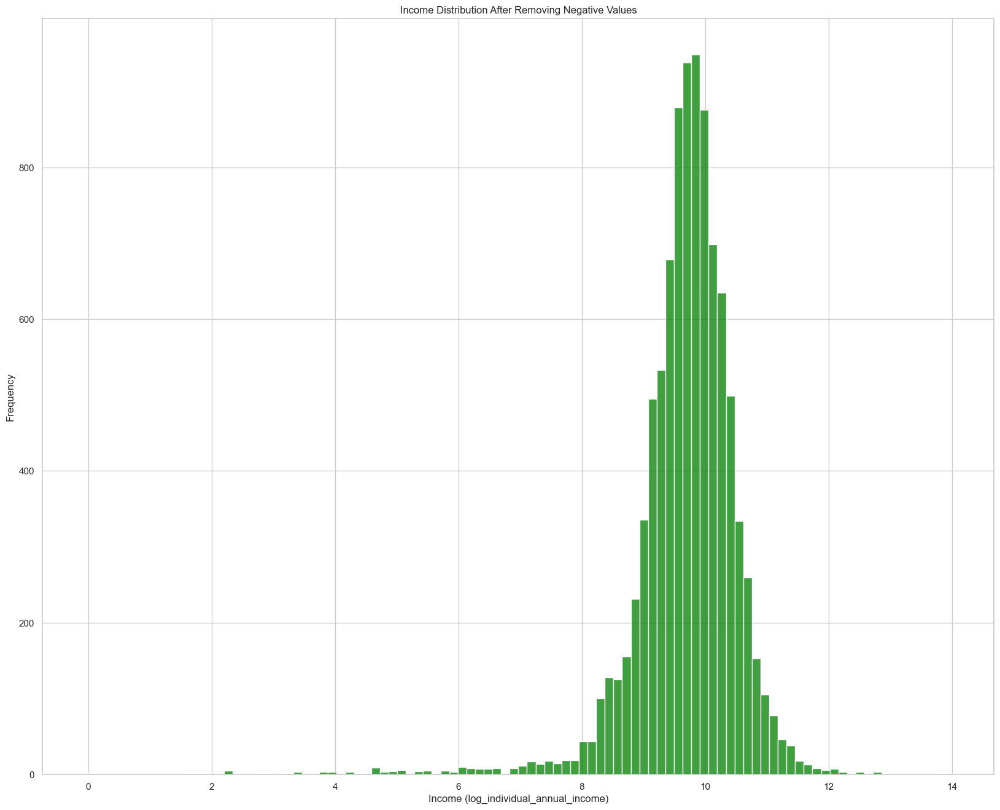

In [110]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plot
sns.set(style="whitegrid")

# Create a histogram for the filtered income data
plt.figure(figsize=(20, 16))
sns.histplot(UKHLA_16_35['log_individual_annual_income'], bins=100, kde=False, color='green')  # KDE (Kernel Density Estimate) is set to False
plt.title('Income Distribution After Removing Negative Values')
plt.xlabel('Income (log_individual_annual_income)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [111]:
# Convert monthly income to annual income by multiplying by 12
UKHLA_16_35['annual_income'] = UKHLA_16_35['klm_fimnnet_dv'] * 12

# Define the bins for the annual income ranges
bins = [0, 10000, 20000, 30000, 40000, 50000, 70000, 100000, float('inf')]
# Define the labels for each bin
labels = ['£0 - £10,000', '£10,001 - £20,000', '£20,001 - £30,000', '£30,001 - £40,000',
          '£40,001 - £50,000', '£50,001 - £70,000', '£70,001 - £100,000', '£100,001 and above']

# Recode the 'annual_income' column into new income groups
UKHLA_16_35['income_group'] = pd.cut(UKHLA_16_35['annual_income'], bins=bins, labels=labels, right=False)

# Optionally, you can check the first few rows to confirm the recoding
print(UKHLA_16_35[['klm_fimnnet_dv', 'annual_income', 'income_group']].head())

    klm_fimnnet_dv  annual_income       income_group
0      2420.000000   29040.000000  £20,001 - £30,000
4      1927.790039   23133.480468  £20,001 - £30,000
8      1662.910034   19954.920408  £10,001 - £20,000
10     3998.669922   47984.039064  £40,001 - £50,000
14     1823.329956   21879.959472  £20,001 - £30,000


In [112]:
# Get value counts for the 'income_group' column
income_group_counts = UKHLA_16_35['income_group'].value_counts()

# Sort the index to display the income groups in order
sorted_income_group_counts = income_group_counts.sort_index()

# Print the value counts for each income group
print(sorted_income_group_counts)

income_group
£0 - £10,000          2140
£10,001 - £20,000     3926
£20,001 - £30,000     2151
£30,001 - £40,000      919
£40,001 - £50,000      369
£50,001 - £70,000      248
£70,001 - £100,000     104
£100,001 and above      61
Name: count, dtype: int64


In [113]:
# Convert monthly income to annual income by multiplying by 12
UKHLA_16_35['annual_income'] = UKHLA_16_35['klm_fimnnet_dv'] * 12

# Define the bins for the new annual income ranges
bins = [0, 10000, 20000, 30000, 40000, float('inf')]
# Define the labels for each bin, merging higher incomes into one category
labels = ['£0 - £10,000', '£10,001 - £20,000', '£20,001 - £30,000', '£30,001 - £40,000', '£40,001 and above']

# Recode the 'annual_income' column into the new income groups
UKHLA_16_35['income_group_two'] = pd.cut(UKHLA_16_35['annual_income'], bins=bins, labels=labels, right=False)

# Print the first few rows to confirm the recoding, including the new 'income_group_two' column
print(UKHLA_16_35[['klm_fimnnet_dv', 'annual_income', 'income_group_two']].head())

    klm_fimnnet_dv  annual_income   income_group_two
0      2420.000000   29040.000000  £20,001 - £30,000
4      1927.790039   23133.480468  £20,001 - £30,000
8      1662.910034   19954.920408  £10,001 - £20,000
10     3998.669922   47984.039064  £40,001 and above
14     1823.329956   21879.959472  £20,001 - £30,000


In [114]:
# Get value counts for the 'income_group_two' column
income_group_two_counts = UKHLA_16_35['income_group_two'].value_counts()

# Sort the index to display the income groups in order
sorted_income_group_two_counts = income_group_two_counts.sort_index()

# Print the value counts for each income group
print(sorted_income_group_two_counts)

income_group_two
£0 - £10,000         2140
£10,001 - £20,000    3926
£20,001 - £30,000    2151
£30,001 - £40,000     919
£40,001 and above     782
Name: count, dtype: int64


In [115]:
# Mapping from current labels to numeric codes
mapping = {
    '£0 - £10,000': 1,
    '£10,001 - £20,000': 2,
    '£20,001 - £30,000': 3,
    '£30,001 - £40,000': 4,
    '£40,001 and above': 5
}


# Recode the 'income_group_two' column using the mapping
UKHLA_16_35['income_group_numeric'] = UKHLA_16_35['income_group_two'].replace(mapping)

# Verify the changes by displaying the first few rows
print(UKHLA_16_35[['income_group_two', 'income_group_numeric']].head())

     income_group_two income_group_numeric
0   £20,001 - £30,000                    3
4   £20,001 - £30,000                    3
8   £10,001 - £20,000                    2
10  £40,001 and above                    5
14  £20,001 - £30,000                    3


C:\Users\annal\AppData\Local\Temp\ipykernel_13764\645586098.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  UKHLA_16_35['income_group_numeric'] = UKHLA_16_35['income_group_two'].replace(mapping)
C:\Users\annal\AppData\Local\Temp\ipykernel_13764\645586098.py:12: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  UKHLA_16_35['income_group_numeric'] = UKHLA_16_35['income_group_two'].replace(mapping)


In [116]:
# Get value counts for the 'income_group_two' column
income_group_two_counts = UKHLA_16_35['income_group_numeric'].value_counts()
income_group_two_counts

income_group_numeric
2    3926
3    2151
1    2140
4     919
5     782
Name: count, dtype: int64

In [117]:
# Now, performing one-hot encoding on the 'household_income_group_numeric' column.
one_hot_encoded_data = pd.get_dummies(UKHLA_16_35['income_group_numeric'], prefix='income_group_numeric')

# Concatenating the original DataFrame with the one-hot encoded DataFrame
UKHLA_16_35 = pd.concat([UKHLA_16_35, one_hot_encoded_data], axis=1)

# To see the updated DataFrame
print(UKHLA_16_35.head())

        pidp  pid  klm_hidp  k_hidp_x  l_hidp_x  m_hidp_x  klm_pno  \
0   68008847   -8  68013624       -14       -14  68013624        1   
4   68068082   -8  68027224       -14       -14  68027224        2   
8   68120367   -8  68340024       -14       -14  68340024        1   
10  68120371   -8  68353624       -14       -14  68353624        1   
14  68121727   -8  68367224       -14       -14  68367224        1   

    klm_wave_x  klm_childpno  klm_hhorig_x  ...  log_individual_annual_income  \
0           13            -8             1  ...                     10.276429   
4           13            -8             1  ...                     10.049036   
8           13            -8             1  ...                      9.901231   
10          13            -8             1  ...                     10.778624   
14          13            -8             1  ...                      9.993326   

    annual_income       income_group   income_group_two  income_group_numeric  \
0    29040.

HOUSEHOLD INCOME

In [118]:
household_income_group_counts = UKHLA_16_35['klm_fihhmnlabnet_dv'].value_counts()
print(household_income_group_counts)

klm_fihhmnlabnet_dv
 0.000000        6304
 1200.000000       34
 1500.000000       22
 500.000000        22
 1300.000000       22
 1600.000000       17
 200.000000        16
 1400.000000       14
 2300.000000       14
 2000.000000       14
 1408.329956       12
 866.669983        12
 433.329987        11
 2700.000000       11
 975.000000        11
 800.000000        11
 400.000000        11
 900.000000        10
 1900.000000       10
 1800.000000       10
 1100.000000       10
 1000.000000       10
 2200.000000       10
 750.000000         9
 3100.000000        9
 1700.000000        9
 700.000000         9
 300.000000         9
 2600.000000        9
 650.000000         8
 3000.000000        8
 1733.329956        8
 2383.330078        7
 758.330017         7
 1850.000000        7
 1950.000000        7
 3500.000000        7
 1083.329956        7
 3900.000000        7
 2900.000000        6
 1450.000000        6
 600.000000         6
 1191.670044        6
 2500.000000        6
 3300.000000

In [119]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_fihhmnlabnet_dv'] >= 0]

In [120]:
# Step 1: Calculate the annual income by multiplying the monthly income by 12
UKHLA_16_35['household_annual_income'] = UKHLA_16_35['klm_fihhmnlabnet_dv'] * 12

# Step 2: Calculate the logarithm of the annual income to create a new variable
UKHLA_16_35['log_household_annual_income'] = np.log(UKHLA_16_35['household_annual_income'])

# Print out the new columns to verify
print(UKHLA_16_35[['klm_fihhmnlabnet_dv', 'household_annual_income', 'log_household_annual_income']].head())

    klm_fihhmnlabnet_dv  household_annual_income  log_household_annual_income
0           1334.000000             16008.000000                     9.680844
4           3474.790039             41697.480469                    10.638196
8              0.000000                 0.000000                         -inf
10             0.000000                 0.000000                         -inf
14           606.669983              7280.039795                     8.892892


c:\Users\annal\OneDrive\Dokumente\Year Two\Dissertation\Coding_UKHLA\dissertation\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [121]:
# Define the bins for the new annual income ranges
bins = [0, 10000, 20000, 30000, 40000, float('inf')]
# Define the labels for each bin, merging higher incomes into one category
labels = ['£0 - £10,000', '£10,001 - £20,000', '£20,001 - £30,000', '£30,001 - £40,000', '£40,001 and above']

# Recode the 'annual_income' column into the new income groups
UKHLA_16_35['household_income_group_two'] = pd.cut(UKHLA_16_35['household_annual_income'], bins=bins, labels=labels, right=False)

# Print the first few rows to confirm the recoding, including the new 'income_group_two' column
print(UKHLA_16_35[['klm_fimnnet_dv', 'household_annual_income', 'household_income_group_two']].head())

    klm_fimnnet_dv  household_annual_income household_income_group_two
0      2420.000000             16008.000000          £10,001 - £20,000
4      1927.790039             41697.480469          £40,001 and above
8      1662.910034                 0.000000               £0 - £10,000
10     3998.669922                 0.000000               £0 - £10,000
14     1823.329956              7280.039795               £0 - £10,000


In [122]:
# Mapping from current labels to numeric codes
mapping = {
    '£0 - £10,000': 1,
    '£10,001 - £20,000': 2,
    '£20,001 - £30,000': 3,
    '£30,001 - £40,000': 4,
    '£40,001 and above': 5
}


# Recode the 'income_group_two' column using the mapping
UKHLA_16_35['household_income_group_numeric'] = UKHLA_16_35['household_income_group_two'].replace(mapping)

# Verify the changes by displaying the first few rows
print(UKHLA_16_35[['household_income_group_two', 'household_income_group_numeric']].head())

   household_income_group_two household_income_group_numeric
0           £10,001 - £20,000                              2
4           £40,001 and above                              5
8                £0 - £10,000                              1
10               £0 - £10,000                              1
14               £0 - £10,000                              1


C:\Users\annal\AppData\Local\Temp\ipykernel_13764\2410637292.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  UKHLA_16_35['household_income_group_numeric'] = UKHLA_16_35['household_income_group_two'].replace(mapping)
C:\Users\annal\AppData\Local\Temp\ipykernel_13764\2410637292.py:12: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  UKHLA_16_35['household_income_group_numeric'] = UKHLA_16_35['household_income_group_two'].replace(mapping)


In [123]:
# Now, performing one-hot encoding on the 'household_income_group_numeric' column.
one_hot_encoded_data = pd.get_dummies(UKHLA_16_35['household_income_group_numeric'], prefix='household_income_group')

# Concatenating the original DataFrame with the one-hot encoded DataFrame
UKHLA_16_35 = pd.concat([UKHLA_16_35, one_hot_encoded_data], axis=1)

# To see the updated DataFrame
print(UKHLA_16_35.head())

        pidp  pid  klm_hidp  k_hidp_x  l_hidp_x  m_hidp_x  klm_pno  \
0   68008847   -8  68013624       -14       -14  68013624        1   
4   68068082   -8  68027224       -14       -14  68027224        2   
8   68120367   -8  68340024       -14       -14  68340024        1   
10  68120371   -8  68353624       -14       -14  68353624        1   
14  68121727   -8  68367224       -14       -14  68367224        1   

    klm_wave_x  klm_childpno  klm_hhorig_x  ...  income_group_numeric_5  \
0           13            -8             1  ...                   False   
4           13            -8             1  ...                   False   
8           13            -8             1  ...                   False   
10          13            -8             1  ...                    True   
14          13            -8             1  ...                   False   

    household_annual_income  log_household_annual_income  \
0              16008.000000                     9.680844   
4       

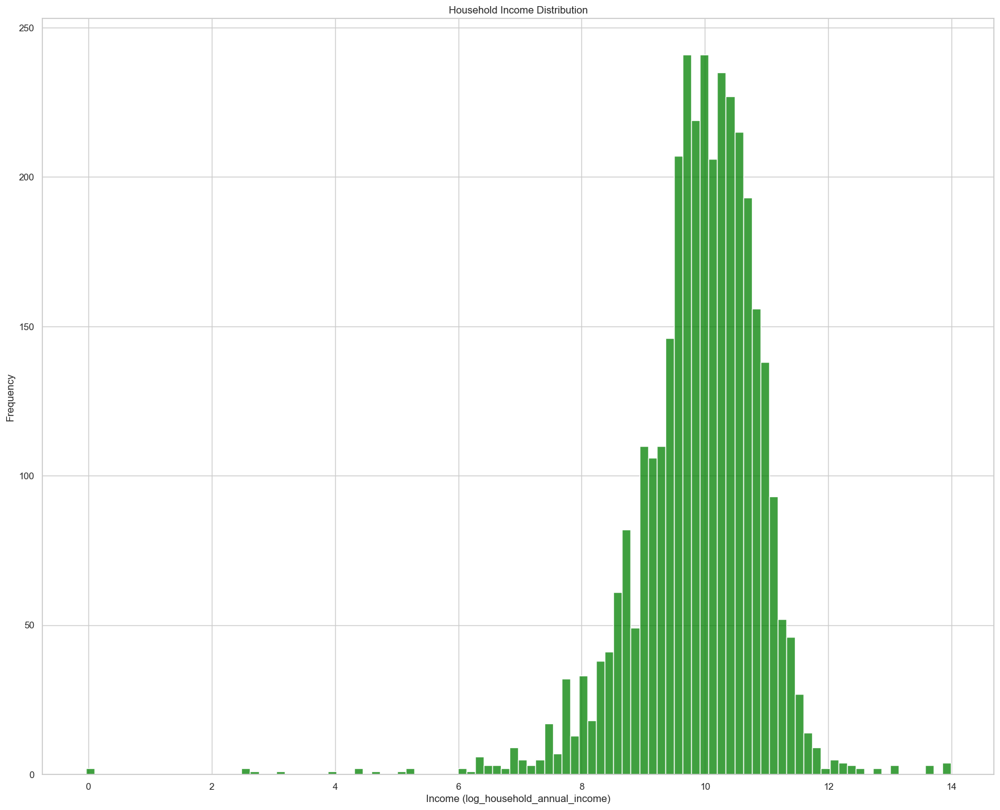

In [124]:
# Set the style for the plot
sns.set(style="whitegrid")

# Create a histogram for the filtered income data
plt.figure(figsize=(20, 16))
sns.histplot(UKHLA_16_35['log_household_annual_income'], bins=100, kde=False, color='green')  # KDE (Kernel Density Estimate) is set to False
plt.title('Household Income Distribution')
plt.xlabel('Income (log_household_annual_income)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

CARES FOR ANOTHER

In [125]:
# Replace -8 with 2 in the 'klm_aidhh' column
UKHLA_16_35['cares_for'] = UKHLA_16_35['klm_aidhh'].replace(-8, 2)

# Calculate the value counts again to check the new distribution
new_cares_counts = UKHLA_16_35['cares_for'].value_counts()

# Print the new value counts
print(new_cares_counts)

cares_for
 2    8980
 1     776
-2       9
-9       1
Name: count, dtype: int64


In [126]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['cares_for'] >= 0]

CARES FOR NON RESIDENT

In [127]:
cares_counts_two = UKHLA_16_35['klm_aidxhh'].value_counts()
print(cares_counts_two)

# Yes 1
# No 2

klm_aidxhh
 2    8708
 1    1043
-1       4
-2       1
Name: count, dtype: int64


In [128]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_aidxhh'] >= 0]

NEW VARIABLE; CARING FOR ANYONE IN OR OUT OF HOUSE

In [129]:
def determine_value(row):
    if row['klm_aidxhh'] == 1 or row['cares_for'] == 1:
        return 1
    elif row['klm_aidxhh'] == 2 and row['cares_for'] == 2:
        return 2
    else:
        return 0  

# Apply the function across rows
UKHLA_16_35['carer_all'] = UKHLA_16_35.apply(determine_value, axis=1)

# Display the first few rows to verify the new variable
print(UKHLA_16_35[['klm_aidxhh', 'cares_for', 'carer_all']])

       klm_aidxhh  cares_for  carer_all
0               2          2          2
4               2          2          2
8               2          2          2
10              2          2          2
14              2          2          2
20              2          2          2
21              2          2          2
27              2          1          1
31              2          2          2
34              2          2          2
35              2          2          2
37              1          1          1
39              2          2          2
40              2          2          2
52              2          1          1
56              2          2          2
57              2          2          2
59              2          2          2
66              2          2          2
67              2          2          2
72              2          2          2
75              2          2          2
76              2          2          2
81              1          2          1


In [130]:
# Create a cross-tabulation of the 'satisfaction_level' and 'carer_all' columns
cross_tabulation = pd.crosstab(UKHLA_16_35['satisfaction_category'], UKHLA_16_35['carer_all'])

# Print the cross-tabulation
print(cross_tabulation)

carer_all                 1     2
satisfaction_category            
Above Median           1005  5171
At or Below Median      687  2888


In [131]:
# One-hot encode 'klm_single_dv' without dropping the original column
encoded_columns = pd.get_dummies(UKHLA_16_35['carer_all'], prefix='carer')

# Concatenate the new one-hot encoded columns back to the original DataFrame
UKHLA_16_35 = pd.concat([UKHLA_16_35, encoded_columns], axis=1)

# Display the first few rows to check the updated DataFrame
print(UKHLA_16_35.head())

        pidp  pid  klm_hidp  k_hidp_x  l_hidp_x  m_hidp_x  klm_pno  \
0   68008847   -8  68013624       -14       -14  68013624        1   
4   68068082   -8  68027224       -14       -14  68027224        2   
8   68120367   -8  68340024       -14       -14  68340024        1   
10  68120371   -8  68353624       -14       -14  68353624        1   
14  68121727   -8  68367224       -14       -14  68367224        1   

    klm_wave_x  klm_childpno  klm_hhorig_x  ...  \
0           13            -8             1  ...   
4           13            -8             1  ...   
8           13            -8             1  ...   
10          13            -8             1  ...   
14          13            -8             1  ...   

    household_income_group_numeric  household_income_group_1  \
0                                2                     False   
4                                5                     False   
8                                1                      True   
10              

LONELY

In [132]:
lonely_count = UKHLA_16_35['klm_sclonely'].value_counts()
print(lonely_count)


klm_sclonely
 1.0    6431
 2.0    2724
 3.0     577
-2.0      11
-1.0       7
-9.0       1
Name: count, dtype: int64


In [133]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_sclonely'] >= 0]

missing	-9	
inapplicable -8	
proxy	-7	
refusal	-2	
don't know	-1		
Hardly ever or never	1	
Some of the time	2	
Often	3	

In [134]:
lonely_count = UKHLA_16_35['klm_sclonely'].value_counts()
print(lonely_count)


klm_sclonely
1.0    6431
2.0    2724
3.0     577
Name: count, dtype: int64


INTERNET USE

In [135]:
INTERNET = UKHLA_16_35['klm_smpost'].value_counts()
print(INTERNET)

klm_smpost
 6    4254
-8    1258
 5    1205
 2     931
 3     846
 1     791
 4     431
-2      10
-1       6
Name: count, dtype: int64


In [136]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_smpost'] >= 0]

In [137]:
# Create a cross-tabulation of the 'satisfaction_level' and 'carer_all' columns
cross_tabulation = pd.crosstab(UKHLA_16_35['satisfaction_category'], UKHLA_16_35['klm_smpost'])

# Print the cross-tabulation
print(cross_tabulation)

klm_smpost               1    2    3    4    5     6
satisfaction_category                               
Above Median           458  584  525  281  763  2739
At or Below Median     333  347  321  150  442  1515


SATSIFACTION WITH INCOME

In [138]:
INCOME_count = UKHLA_16_35['klm_sclfsat2'].value_counts()
print(INCOME_count)

klm_sclfsat2
 6.0    3289
 7.0    1601
 5.0    1395
 4.0    1080
 3.0     574
 2.0     331
 1.0     185
-2.0       3
Name: count, dtype: int64


In [139]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_sclfsat2'] >= 0]

HOW OFTEN FEELS LACK OF COMPANIONSHIP

In [140]:
companionship_count = UKHLA_16_35['klm_sclackcom'].value_counts()
print(companionship_count)

klm_sclackcom
 1.0    5050
 2.0    2776
 3.0     627
-1.0       1
-2.0       1
Name: count, dtype: int64


In [141]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_sclackcom'] >= 0]

TENURE

In [142]:
tenure_count = UKHLA_16_35['klm_tenure_dv'].value_counts()
print(tenure_count)

klm_tenure_dv
 1.0    6287
 2.0    1062
 3.0     411
 4.0     335
 6.0     280
 5.0      39
 8.0      29
-9.0      10
Name: count, dtype: int64


In [143]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_tenure_dv'] >= 0]

In [144]:
tenure_count = UKHLA_16_35['klm_tenure_dv'].value_counts()
print(tenure_count)

klm_tenure_dv
1.0    6287
2.0    1062
3.0     411
4.0     335
6.0     280
5.0      39
8.0      29
Name: count, dtype: int64


Owned outright	1	
Owned with mortgage	2	
Local authority rent	3	
Housing assoc rented	4	
Rented from employer	5	
Rented private unfurnished	6		
Rented private furnished	7		
Other	8

In [145]:
# Define the mapping from original to new categories
recode_map = {
    1: 1,
    2: 1,
    3: 2,
    4: 2,
    5: 3,
    6: 3,
    7: 3,
    8: 4
}

# Recode the 'klm_tenure_dv' column using the map
UKHLA_16_35['tenure_recoded'] = UKHLA_16_35['klm_tenure_dv'].map(recode_map)

In [146]:
# One-hot encode the 'klm_tenure_dv' column
one_hot_encoded = pd.get_dummies(UKHLA_16_35['tenure_recoded'], prefix='tenure')

# Concatenate the one-hot encoded columns back to the original DataFrame
UKHLA_16_35 = pd.concat([UKHLA_16_35, one_hot_encoded], axis=1)

# Display the updated DataFrame
print(UKHLA_16_35)

             pidp        pid    klm_hidp    k_hidp_x    l_hidp_x   m_hidp_x  \
0        68008847         -8    68013624         -14         -14   68013624   
4        68068082         -8    68027224         -14         -14   68027224   
8        68120367         -8    68340024         -14         -14   68340024   
10       68120371         -8    68353624         -14         -14   68353624   
14       68121727         -8    68367224         -14         -14   68367224   
20       68129887         -8    68387624         -14         -14   68387624   
21       68131927         -8    68394424         -14         -14   68394424   
27       68138051         -8    68421624         -14         -14   68421624   
31       68142135         -8    68448824         -14         -14   68448824   
34       68148247         -8    68462424         -14         -14   68462424   
35       68148251         -8    68462424         -14         -14   68462424   
37       68150971         -8    68469224         -14

HEALTH LIMITS WORK

In [147]:

lonely_count = UKHLA_16_35['klm_scsf3a'].value_counts()
print(lonely_count)

klm_scsf3a
 5.0    3586
 3.0    1904
 4.0    1728
 2.0     797
 1.0     417
-2.0       7
-1.0       4
Name: count, dtype: int64


In [148]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_scsf3a'] >= 0]

HEALTH LIMITS MODERATE ACTIVITIES

In [149]:

health_limits_count = UKHLA_16_35['klm_scsf2a'].value_counts()
print(health_limits_count)

klm_scsf2a
 3.0    5380
 2.0    2107
 1.0     942
-1.0       3
Name: count, dtype: int64


In [150]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_scsf2a'] >= 0]

ALCOHOL FREQUENCY

In [151]:
lonely_count = UKHLA_16_35['klm_auditc3'].value_counts()
print(lonely_count)

klm_auditc3
 4.0    2013
-8.0    1838
 5.0    1797
 2.0    1383
 3.0    1359
 1.0      28
-2.0       8
-1.0       3
Name: count, dtype: int64


In [152]:
# Replace all instances of -8 with 1
UKHLA_16_35['klm_auditc3'] = UKHLA_16_35['klm_auditc3'].replace(-8, 1)

# Now, you can check the updated value counts to confirm the change
lonely_count_updated = UKHLA_16_35['klm_auditc3'].value_counts()
print(lonely_count_updated)

klm_auditc3
 4.0    2013
 1.0    1866
 5.0    1797
 2.0    1383
 3.0    1359
-2.0       8
-1.0       3
Name: count, dtype: int64


In [153]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_auditc3'] >= 0]

SMOKER

In [154]:
smoker_count = UKHLA_16_35['klm_smoker'].value_counts()
print(smoker_count)

klm_smoker
 2    7798
 1     618
-2       2
Name: count, dtype: int64


In [155]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_smoker'] >= 0]

In [156]:
smoker_count = UKHLA_16_35['klm_smoker'].value_counts()
print(smoker_count)

klm_smoker
2    7798
1     618
Name: count, dtype: int64


HEALTH BEHAVIOUR - WALKING

In [157]:


walking_count = UKHLA_16_35['klm_vday'].value_counts()
print(walking_count)

klm_vday
 0    5378
 2     715
 3     584
 1     544
 5     377
 4     350
 7     274
 6     109
-1      60
-2      25
Name: count, dtype: int64


In [158]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_vday'] >= 0]

OVERWEIGHT

In [159]:


single_count = UKHLA_16_35['klm_hcond_cov27'].value_counts()
print(single_count)

klm_hcond_cov27
 0    8029
 1     280
-1      16
-2       6
Name: count, dtype: int64


In [160]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_hcond_cov27'] >= 0]

SMARTPHONE

In [161]:

smartphone_count = UKHLA_16_35['klm_smtphone'].value_counts()
print(smartphone_count)

klm_smtphone
 1    6071
 2    2201
-2      20
-1      17
Name: count, dtype: int64


In [162]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_smtphone'] >= 0]

In [163]:
# One-hot encode the 'klm_smtphone' column
one_hot_encoded = pd.get_dummies(UKHLA_16_35['klm_smtphone'], prefix='smtphone')
    # Concatenate the one-hot encoded columns back to the original DataFrame
UKHLA_16_35 = pd.concat([UKHLA_16_35.drop('klm_smtphone', axis=1), one_hot_encoded], axis=1)

# Display the updated DataFrame to verify changes
print(UKHLA_16_35.head())

        pidp  pid  klm_hidp  k_hidp_x  l_hidp_x  m_hidp_x  klm_pno  \
0   68008847   -8  68013624       -14       -14  68013624        1   
4   68068082   -8  68027224       -14       -14  68027224        2   
10  68120371   -8  68353624       -14       -14  68353624        1   
14  68121727   -8  68367224       -14       -14  68367224        1   
20  68129887   -8  68387624       -14       -14  68387624        1   

    klm_wave_x  klm_childpno  klm_hhorig_x  ...  carer_all  carer_1  carer_2  \
0           13            -8             1  ...          2    False     True   
4           13            -8             1  ...          2    False     True   
10          13            -8             1  ...          2    False     True   
14          13            -8             1  ...          2    False     True   
20          13            -8             1  ...          2    False     True   

    tenure_recoded  tenure_1  tenure_2  tenure_3  tenure_4  smtphone_1  \
0                1      

HAVE YOU RECENTLY FELT YOU COULDNT OVERCOME DIFFICULTIES

In [164]:

single_count = UKHLA_16_35['klm_scghqf'].value_counts()
print(single_count)

klm_scghqf
 2.0    3839
 1.0    3565
 3.0     737
 4.0     122
-1.0       6
-2.0       3
Name: count, dtype: int64


In [165]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_scghqf'] >= 0]

ISOLATED

In [166]:
single_count = UKHLA_16_35['klm_scisolate'].value_counts()
print(single_count)

klm_scisolate
 1.0    5115
 2.0    2585
 3.0     561
-1.0       2
Name: count, dtype: int64


In [167]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_scisolate'] >= 0]

MENTAL HEALTH - GHQ

In [168]:
single_count = UKHLA_16_35['klm_scghq2_dv'].value_counts()
print(single_count)

klm_scghq2_dv
 0.0     4892
 1.0     1055
 2.0      544
 3.0      331
 4.0      259
 5.0      214
 6.0      174
 7.0      164
 12.0     143
 11.0     121
 8.0      116
 9.0      115
 10.0     112
-8.0       21
Name: count, dtype: int64


In [169]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_scghq2_dv'] >= 0]

JOB STATUS

In [170]:

job_status = UKHLA_16_35['klm_jbstat'].value_counts()
print(job_status)

klm_jbstat
 4     5882
 2     1398
 1      451
 8      179
 3      122
 6       90
 12      59
 97      29
 13      19
 10       7
 7        2
-1        1
-2        1
Name: count, dtype: int64


In [171]:
# Step 1: Remove values less than zero
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_jbstat'] >= 0]

Self employed	1	
Paid employment(ft/pt)	2	
Unemployed	3	
Retired	4	
On maternity leave	5	
Family care or home	6	
Full-time student	7	
LT sick or disabled	8	
Govt training scheme	9	
Unpaid, family business	10	
On apprenticeship	11		
On furlough	12	
Temporarily laid off/short term working	13	
On shared parental leave	14	
Doing something else	97	

In [172]:
# Creating the 'unemployed' variable
UKHLA_16_35['unemployed'] = (UKHLA_16_35['klm_jbstat'] == 3).astype(int)

In [173]:
# Creating the 'unemployed' variable
UKHLA_16_35['sick or disabled'] = (UKHLA_16_35['klm_jbstat'] == 8).astype(int)

In [174]:
# Creating the 'unemployed' variable
UKHLA_16_35['student'] = (UKHLA_16_35['klm_jbstat'] == 7).astype(int)

SINGLE

In [175]:
single_count = UKHLA_16_35['klm_single_dv'].value_counts()
print(single_count)

klm_single_dv
0.0    5836
1.0    2402
Name: count, dtype: int64


In [176]:
# One-hot encode 'klm_single_dv' without dropping the original column
encoded_columns = pd.get_dummies(UKHLA_16_35['klm_single_dv'], prefix='single')

# Concatenate the new one-hot encoded columns back to the original DataFrame
UKHLA_16_35 = pd.concat([UKHLA_16_35, encoded_columns], axis=1)

# Display the first few rows to check the updated DataFrame
print(UKHLA_16_35.head())

        pidp  pid  klm_hidp  k_hidp_x  l_hidp_x  m_hidp_x  klm_pno  \
0   68008847   -8  68013624       -14       -14  68013624        1   
4   68068082   -8  68027224       -14       -14  68027224        2   
10  68120371   -8  68353624       -14       -14  68353624        1   
14  68121727   -8  68367224       -14       -14  68367224        1   
20  68129887   -8  68387624       -14       -14  68387624        1   

    klm_wave_x  klm_childpno  klm_hhorig_x  ...  tenure_2  tenure_3  tenure_4  \
0           13            -8             1  ...     False     False     False   
4           13            -8             1  ...     False     False     False   
10          13            -8             1  ...     False     False     False   
14          13            -8             1  ...     False     False     False   
20          13            -8             1  ...     False     False     False   

    smtphone_1  smtphone_2  unemployed  sick or disabled  student  single_0.0  \
0         T

    HOUSEHOLD HAS CENTRAL HEATING

In [177]:
heat_count = UKHLA_16_35['klm_heatch'].value_counts()
print(heat_count)

klm_heatch
 1.0    7329
 2.0     900
-1.0       6
-2.0       3
Name: count, dtype: int64


In [178]:
UKHLA_16_35 = UKHLA_16_35[UKHLA_16_35['klm_heatch'] >= 0]

In [179]:
# Recoding the values: 1 becomes 0 and 2 becomes 1.
recoded_data = UKHLA_16_35['klm_heatch'].replace({1: 0, 2: 1})

# Replacing the old 'klm_heatch' column with the recoded data
UKHLA_16_35.loc[UKHLA_16_35['klm_heatch'] >= 0, 'klm_heatch'] = recoded_data

INTERNET AT HOME

In [180]:
internet_count = UKHLA_16_35['klm_pcnet'].value_counts()
print(internet_count)

klm_pcnet
 1.0    8134
 2.0      93
-1.0       2
Name: count, dtype: int64


In [181]:
# Recoding the values: 1 becomes 0 and 2 becomes 1.
recoded_data = UKHLA_16_35['klm_pcnet'].replace({1: 0, 2: 1})

# Replacing the old 'klm_heatch' column with the recoded data
UKHLA_16_35.loc[UKHLA_16_35['klm_pcnet'] >= 0, 'klm_pcnet'] = recoded_data

In [182]:
rename_dict = {
    'klm_sclfsato': 'life satisfaction',
    'klm_scghq2_dv' : 'subjective wellbeing GHQ',
    'carer_all': 'carer',
    'klm_sclonely': 'how often feels lonely',
    'klm_smpost': 'frequency of posting on social',
    'klm_sclfsat2': 'satisfaction with income',
    'klm_sclfsat1' : 'satisfaction with health',
    'klm_sclfsat7' : 'satisfaction with leisure time',
    'klm_scsf3a': 'health limits work',
    'klm_scsf2a': 'health limits moderate activities',
    'klm_auditc3': 'alcohol frequency past 12 months',
    'klm_smoker': 'smoker',
    'klm_scsf1': 'subjective general health',
    'klm_vday': 'how many days vigorous activity',
    'klm_single_dv': 'relationship status',
    'single_0.0': 'not single',
    'single_1.0': 'single',
    'tenure_recoded': 'tenure',
    'tenure_1': 'own property',
    'tenure_2': 'local authority property',
    'klm_scisolate': 'how often feels isolated',
    'klm_sclackcom' : 'how often feels lack of companionship',
    'klm_scghqf': 'how often feels can overcome difficulties',
    'smtphone_1': 'has access to smartphone',  
    'smtphone_0': 'does not have access to smartphone',  
    'klm_hcond_cov27': 'mentioned overweight',
    'log_household_annual_income': 'household income log',
    'log_individual_annual_income': 'individual income log',
    'income_group_numeric': 'individual income level scale',
    'income_group_numeric_1': 'individual income £0 - £10,000',  
    'income_group_numeric_2': 'individual income £10,001 - £20,000',
    'income_group_numeric_3': 'individual income £20,001 - £30,000',  
    'income_group_numeric_4': 'individual income £30,001 - £40,000',
    'income_group_numeric_5': 'individual income £40,001 and above',
    'household_income_group_numeric': 'household income level scale',
    'household_income_group_1': 'household income £0 - £10,000',
    'household_income_group_2': 'household income £10,001 - £20,000',
    'household_income_group_3': 'household income £20,001 - £30,000',  
    'household_income_group_4': 'household income £30,001 - £40,000',
    'household_income_group_5': 'household income £40,001 and above',
    'klm_heatch': 'household has central heating',
    'klm_pcnet': 'household has internet',
    'klm_finnow' : 'how well managing financially',
    'klm_health' : 'long standing physical or mental disability'
}

# Rename the columns
UKHLA_16_35.rename(columns=rename_dict, inplace=True)

# To verify changes, print the updated DataFrame columns
print(UKHLA_16_35.columns)

Index(['pidp', 'pid', 'klm_hidp', 'k_hidp_x', 'l_hidp_x', 'm_hidp_x',
       'klm_pno', 'klm_wave_x', 'klm_childpno', 'klm_hhorig_x',
       ...
       'local authority property', 'tenure_3', 'tenure_4',
       'has access to smartphone', 'smtphone_2', 'unemployed',
       'sick or disabled', 'student', 'not single', 'single'],
      dtype='object', length=2379)


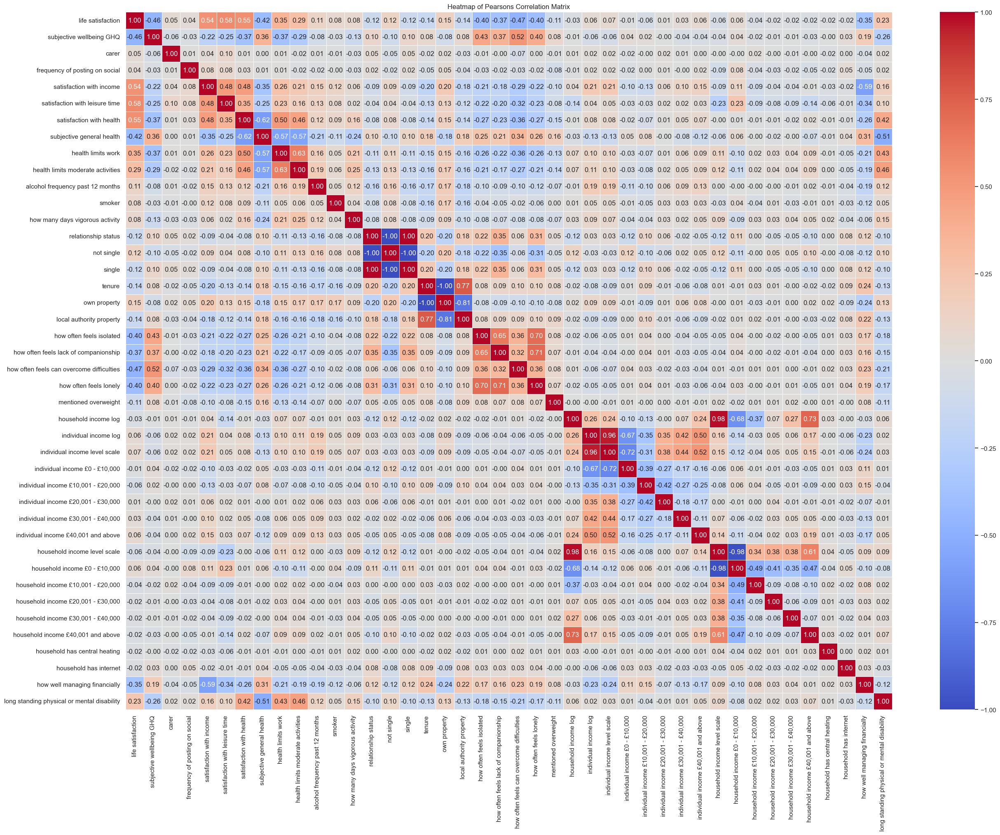

In [183]:
# Assuming UKHLA_16_35 is your DataFrame and it includes the specified variables
# Calculate Spearman's correlation matrix (more suitable for categorical and non-normal data)
correlation_matrix = UKHLA_16_35[['life satisfaction', 
    'subjective wellbeing GHQ', 
    'carer', 
    'frequency of posting on social', 
    'satisfaction with income', 
    'satisfaction with leisure time', 
    'satisfaction with health', 
    'subjective general health',
    'health limits work', 
    'health limits moderate activities',
    'alcohol frequency past 12 months',
    'smoker',
    'how many days vigorous activity',
    'relationship status',
    'not single',
    'single',
    'tenure',
    'own property',
    'local authority property',
    'how often feels isolated',
    'how often feels lack of companionship',
    'how often feels can overcome difficulties',
    'how often feels lonely', 
    'mentioned overweight',
    'household income log',
    'individual income log',
    'individual income level scale',
    'individual income £0 - £10,000',  
    'individual income £10,001 - £20,000',
    'individual income £20,001 - £30,000',  
    'individual income £30,001 - £40,000',
    'individual income £40,001 and above',
    'household income level scale',
    'household income £0 - £10,000',
    'household income £10,001 - £20,000',
    'household income £20,001 - £30,000',  
    'household income £30,001 - £40,000',
    'household income £40,001 and above',
    'household has central heating',
    'household has internet',
    'how well managing financially',
    'long standing physical or mental disability'
    ]].corr(method='spearman')

# Create a heatmap from the correlation matrix
plt.figure(figsize=(30, 22))  # Adjust the size of the figure as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Heatmap of Pearsons Correlation Matrix')
plt.show()

MODEL BUILD

In [184]:
# Create a list of variables 
variables_final = [
    'life satisfaction',  
    'subjective wellbeing GHQ', 
    'satisfaction with income', 
    'satisfaction with leisure time', 
    'satisfaction with health',
    'carer', 
    'frequency of posting on social', 
    'subjective general health',
    'health limits work', 
    'health limits moderate activities',
    'alcohol frequency past 12 months',
    'smoker',
    'how many days vigorous activity',
    'relationship status',
    #'not single',
    #'single',
    #'tenure',
    'own property',
    'local authority property',
    'how often feels isolated',
    'how often feels lack of companionship',
    'how often feels can overcome difficulties',
    'how often feels lonely', 
    'mentioned overweight',
    #'individual income £0 - £10,000',  
    #'individual income £10,001 - £20,000',
    #'individual income £20,001 - £30,000',  
    #'individual income £30,001 - £40,000',
    #'individual income £40,001 and above',
    #'household income £0 - £10,000',
    #'household income £10,001 - £20,000',
    #'household income £20,001 - £30,000',  
    #'household income £30,001 - £40,000',
    #'household income £40,001 and above',
    'household has central heating',
    'household has internet',
    'individual income level scale',
    'household income level scale',
    'how well managing financially',
    'long standing physical or mental disability'
]



# Creating a smaller DataFrame with the listed variables for decision tree input
UKHLA_16_35_subset = UKHLA_16_35[variables_final]

In [185]:
# Display data types
print("Data Types:\n", UKHLA_16_35_subset.dtypes)

# Check for non-numeric data by trying to convert all columns to numeric
for column in UKHLA_16_35_subset.columns:
    UKHLA_16_35_subset[column] = pd.to_numeric(UKHLA_16_35_subset[column], errors='coerce')

# Check for NaNs in the dataset
print("\nNaN Values in Each Column:\n", UKHLA_16_35_subset.isna().sum())


Data Types:
 life satisfaction                               float64
subjective wellbeing GHQ                        float64
satisfaction with income                        float64
satisfaction with leisure time                  float64
satisfaction with health                        float64
carer                                             int64
frequency of posting on social                    int64
subjective general health                       float64
health limits work                              float64
health limits moderate activities               float64
alcohol frequency past 12 months                float64
smoker                                            int64
how many days vigorous activity                   int64
relationship status                             float64
own property                                       bool
local authority property                           bool
how often feels isolated                        float64
how often feels lack of companionsh

C:\Users\annal\AppData\Local\Temp\ipykernel_13764\724786712.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UKHLA_16_35_subset[column] = pd.to_numeric(UKHLA_16_35_subset[column], errors='coerce')


In [186]:
# Convert boolean columns to int if needed
bool_columns = UKHLA_16_35_subset.select_dtypes(include=['bool']).columns
UKHLA_16_35_subset[bool_columns] = UKHLA_16_35_subset[bool_columns].astype(int)

# Re-check data types
print("\nData Types after Conversion:\n", UKHLA_16_35_subset.dtypes)


Data Types after Conversion:
 life satisfaction                              float64
subjective wellbeing GHQ                       float64
satisfaction with income                       float64
satisfaction with leisure time                 float64
satisfaction with health                       float64
carer                                            int64
frequency of posting on social                   int64
subjective general health                      float64
health limits work                             float64
health limits moderate activities              float64
alcohol frequency past 12 months               float64
smoker                                           int64
how many days vigorous activity                  int64
relationship status                            float64
own property                                     int32
local authority property                         int32
how often feels isolated                       float64
how often feels lack of companions

C:\Users\annal\AppData\Local\Temp\ipykernel_13764\599762428.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UKHLA_16_35_subset[bool_columns] = UKHLA_16_35_subset[bool_columns].astype(int)


In [187]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Adding a constant to the model for the intercept
df = add_constant(UKHLA_16_35_subset)

# Calculating VIF for each variable
vif_data = pd.DataFrame()
vif_data["Variable"] = df.columns  # Corrected to use df.columns after 'life satisfaction' has been removed
vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]

print(vif_data)

                                       Variable         VIF
0                                         const  281.627712
1                             life satisfaction    2.612561
2                      subjective wellbeing GHQ    2.109646
3                      satisfaction with income    2.148260
4                satisfaction with leisure time    1.807334
5                      satisfaction with health    2.224517
6                                         carer    1.020950
7                frequency of posting on social    1.025999
8                     subjective general health    2.348983
9                            health limits work    2.128848
10            health limits moderate activities    2.104486
11             alcohol frequency past 12 months    1.147850
12                                       smoker    1.050501
13              how many days vigorous activity    1.073236
14                          relationship status    1.273068
15                                 own p

In [188]:
# Assuming 'target_variable' is the name of your target column in the DataFrame
X = UKHLA_16_35_subset.drop('life satisfaction', axis=1)  # Features
y = UKHLA_16_35_subset['life satisfaction']  # Target variable

# Splitting the dataset into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [189]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor

# Define the range of depths to search
param_grid = {'max_depth': range(1, 11)}  # Adjust the range as needed

# Initialize the decision tree regressor
tree = DecisionTreeRegressor(random_state=0)

# Initialize GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(estimator=tree, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Perform grid search
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_depth = grid_search.best_params_['max_depth']

print(f"Optimal tree depth: {best_depth}")

# Initialize decision tree with optimal depth
optimal_tree = DecisionTreeRegressor(max_depth=best_depth, random_state=0)

# Train the decision tree on the training set
optimal_tree.fit(X_train, y_train)

# Predict on the test set with the optimal tree
tree_predictions = optimal_tree.predict(X_test)

# Calculate Mean Squared Error
optimal_tree_mse = mean_squared_error(y_test, tree_predictions)
print(f"Optimal Decision Tree Mean Squared Error: {optimal_tree_mse:.2f}")

# Calculate Root Mean Squared Error
optimal_tree_rmse = np.sqrt(optimal_tree_mse)
print(f"Optimal Decision Tree Root Mean Squared Error: {optimal_tree_rmse:.2f}")

Optimal tree depth: 5
Optimal Decision Tree Mean Squared Error: 0.77
Optimal Decision Tree Root Mean Squared Error: 0.88


In [202]:
# Define a threshold
threshold = 1  # Adjust this based on your understanding of what constitutes a 'close enough' prediction

# Calculate the number of predictions within the threshold
accurate_predictions = np.sum(np.abs(y_test - tree_predictions) <= threshold)
inaccurate_predictions = len(tree_predictions) - accurate_predictions

print(f'Number of accurate predictions: {accurate_predictions}')
print(f'Number of inaccurate predictions: {inaccurate_predictions}')

Number of accurate predictions: 1341
Number of inaccurate predictions: 305


In [203]:

# Create a DataFrame to show true labels and predictions
results_df = pd.DataFrame({
    'True Label': y_test,
    'Prediction': tree_predictions,
    'Accurate': np.abs(y_test - tree_predictions) <= threshold
})


Number of accurate predictions: 1341
Number of inaccurate predictions: 305


In [204]:
results_df

,True Label,Prediction,Accurate
3595,7.0,6.141938,True
23169,7.0,6.779783,True
9296,5.0,6.141938,False
21501,6.0,5.858713,True
136,5.0,6.141938,False
18191,6.0,5.858713,True
15277,6.0,6.141938,True
28036,6.0,6.141938,True
10028,4.0,6.141938,False
10370,6.0,6.141938,True


In [191]:
# Feature importances from the decision tree
tree_feature_importances = optimal_tree.feature_importances_

# Assuming X_train has column names
feature_names = X_train.columns

# Create a dictionary to view feature names and their corresponding importances
tree_importances = dict(zip(feature_names, tree_feature_importances))
print("Decision Tree Feature Importances:")
for name, importance in sorted(tree_importances.items(), key=lambda item: item[1], reverse=True):
    print(f"{name}: {importance:.4f}")

Decision Tree Feature Importances:
satisfaction with leisure time: 0.5402
subjective wellbeing GHQ: 0.2323
satisfaction with income: 0.1351
satisfaction with health: 0.0483
how often feels lonely: 0.0178
how often feels lack of companionship: 0.0095
how often feels isolated: 0.0069
how well managing financially: 0.0052
long standing physical or mental disability: 0.0018
alcohol frequency past 12 months: 0.0017
health limits work: 0.0012
carer: 0.0000
frequency of posting on social: 0.0000
subjective general health: 0.0000
health limits moderate activities: 0.0000
smoker: 0.0000
how many days vigorous activity: 0.0000
relationship status: 0.0000
own property: 0.0000
local authority property: 0.0000
how often feels can overcome difficulties: 0.0000
mentioned overweight: 0.0000
household has central heating: 0.0000
household has internet: 0.0000
individual income level scale: 0.0000
household income level scale: 0.0000


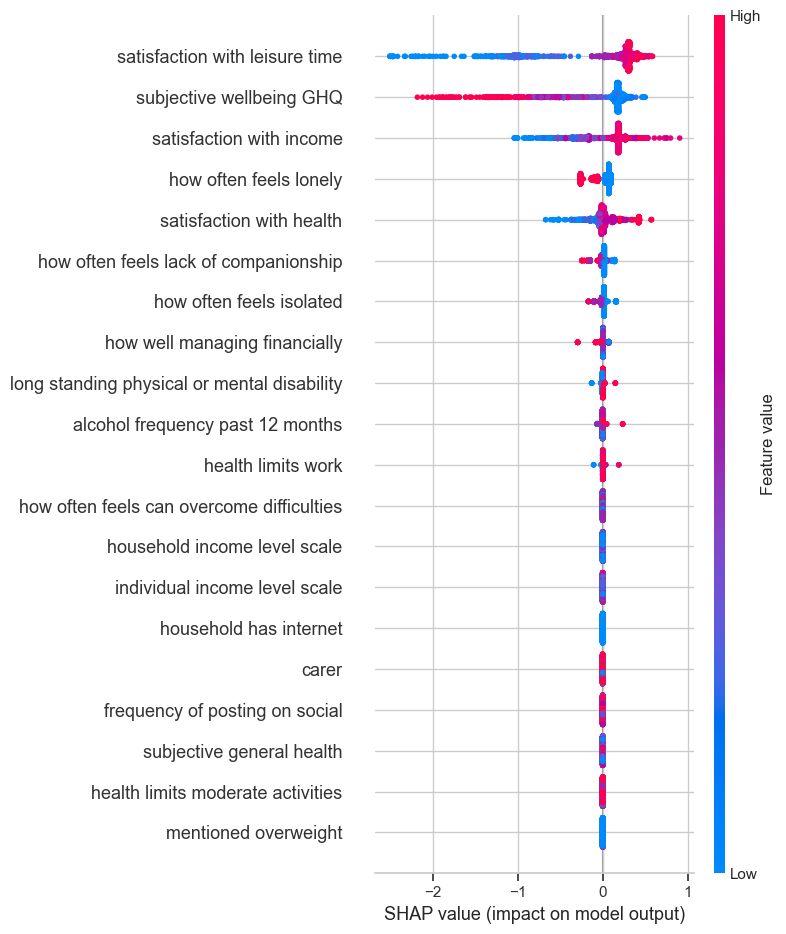

In [192]:
# Initialize the SHAP Explainer object with your tree model
explainer = shap.Explainer(optimal_tree)
shap_values = explainer(X_test)
shap.summary_plot(shap_values, X_test)

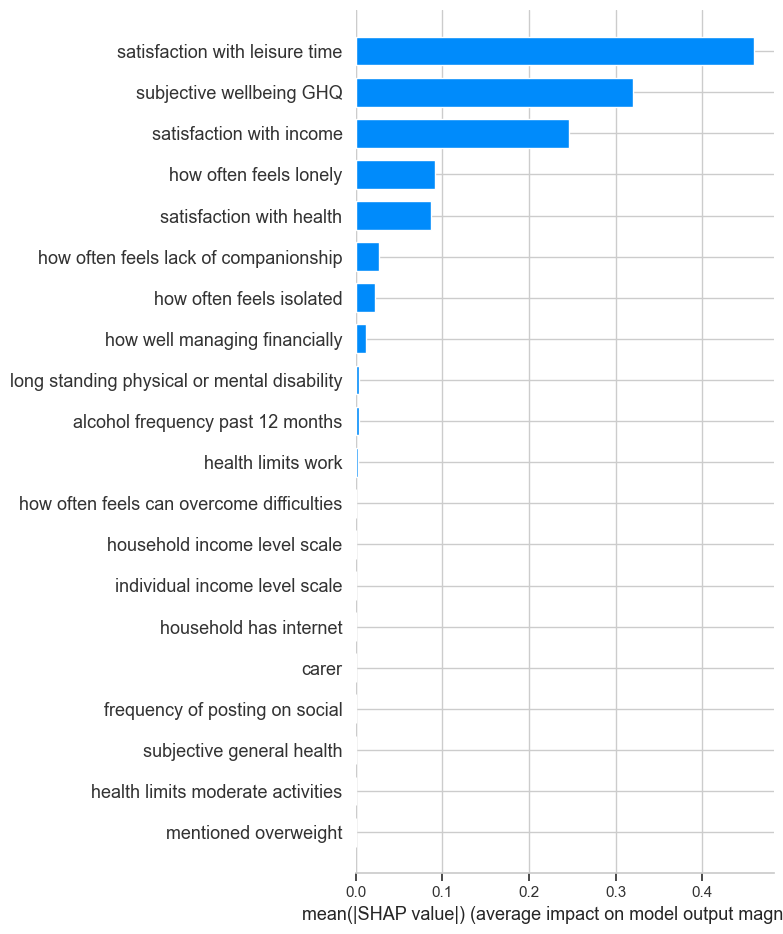

In [193]:
# Initialize the SHAP Explainer object with your tree model
explainer = shap.Explainer(optimal_tree)
shap_values = explainer(X_test)
shap.summary_plot(shap_values, X_test, plot_type='bar')

In [194]:
shap_values = explainer.shap_values(X_test)

In [195]:
shap_values

array([[ 0.17684148,  0.17936257,  0.29854085, ...,  0.        ,
         0.00288857,  0.00222386],
       [ 0.21953923,  0.26395163,  0.40735674, ...,  0.        ,
         0.00288857, -0.00194588],
       [ 0.22161473,  0.18557235,  0.27927573, ...,  0.        ,
         0.00582978, -0.00194588],
       ...,
       [ 0.22161473,  0.18296236,  0.27666575, ...,  0.        ,
         0.00582978,  0.00222386],
       [-0.44589177, -0.11263593,  0.25283417, ...,  0.        ,
         0.07044851, -0.00109183],
       [ 0.17521506,  0.1798269 ,  0.27681071, ...,  0.        ,
         0.00288857, -0.00194588]])

In [196]:
# Convert shap_values to a NumPy array if it's not already
shap_values_array = np.array(shap_values)

# Compute the mean absolute SHAP value for each feature
mean_abs_shap_values = np.mean(np.abs(shap_values_array), axis=0)

# Print the mean absolute SHAP values for each feature
for feature_index, mean_abs_shap_value in enumerate(mean_abs_shap_values):
    print(f"Mean absolute SHAP value for feature {feature_index}: {mean_abs_shap_value}")

Mean absolute SHAP value for feature 0: 0.31946694148469484
Mean absolute SHAP value for feature 1: 0.24583189210686648
Mean absolute SHAP value for feature 2: 0.4597247656322588
Mean absolute SHAP value for feature 3: 0.0865989385769831
Mean absolute SHAP value for feature 4: 0.0
Mean absolute SHAP value for feature 5: 0.0
Mean absolute SHAP value for feature 6: 0.0
Mean absolute SHAP value for feature 7: 0.0026659640175348944
Mean absolute SHAP value for feature 8: 0.0
Mean absolute SHAP value for feature 9: 0.00349248517679111
Mean absolute SHAP value for feature 10: 0.0
Mean absolute SHAP value for feature 11: 0.0
Mean absolute SHAP value for feature 12: 0.0
Mean absolute SHAP value for feature 13: 0.0
Mean absolute SHAP value for feature 14: 0.0
Mean absolute SHAP value for feature 15: 0.021809048652582784
Mean absolute SHAP value for feature 16: 0.027156711391125896
Mean absolute SHAP value for feature 17: 0.0
Mean absolute SHAP value for feature 18: 0.09148378728934377
Mean abso

In [197]:
# Assuming feature_names is a list of feature names corresponding to the SHAP values
for feature_index, (feature_name, mean_abs_shap_value) in enumerate(zip(feature_names, mean_abs_shap_values)):
    print(f"Mean absolute SHAP value for feature '{feature_name}': {mean_abs_shap_value}")

Mean absolute SHAP value for feature 'subjective wellbeing GHQ': 0.31946694148469484
Mean absolute SHAP value for feature 'satisfaction with income': 0.24583189210686648
Mean absolute SHAP value for feature 'satisfaction with leisure time': 0.4597247656322588
Mean absolute SHAP value for feature 'satisfaction with health': 0.0865989385769831
Mean absolute SHAP value for feature 'carer': 0.0
Mean absolute SHAP value for feature 'frequency of posting on social': 0.0
Mean absolute SHAP value for feature 'subjective general health': 0.0
Mean absolute SHAP value for feature 'health limits work': 0.0026659640175348944
Mean absolute SHAP value for feature 'health limits moderate activities': 0.0
Mean absolute SHAP value for feature 'alcohol frequency past 12 months': 0.00349248517679111
Mean absolute SHAP value for feature 'smoker': 0.0
Mean absolute SHAP value for feature 'how many days vigorous activity': 0.0
Mean absolute SHAP value for feature 'relationship status': 0.0
Mean absolute SHAP

In [198]:
# Compute the standard deviation of the mean absolute SHAP values for each feature
std_mean_abs_shap_values = np.std(np.abs(shap_values), axis=0)

In [199]:
# Print the standard deviation of the mean absolute SHAP values for each feature
for feature_index, std_mean_abs_shap_value in enumerate(std_mean_abs_shap_values):
    print(f"Standard deviation of mean absolute SHAP value for feature {feature_index}: {std_mean_abs_shap_value}")

Standard deviation of mean absolute SHAP value for feature 0: 0.3362811592649629
Standard deviation of mean absolute SHAP value for feature 1: 0.15485857983537138
Standard deviation of mean absolute SHAP value for feature 2: 0.40268810655978515
Standard deviation of mean absolute SHAP value for feature 3: 0.1150265387667576
Standard deviation of mean absolute SHAP value for feature 4: 0.0
Standard deviation of mean absolute SHAP value for feature 5: 0.0
Standard deviation of mean absolute SHAP value for feature 6: 0.0
Standard deviation of mean absolute SHAP value for feature 7: 0.011859646784231093
Standard deviation of mean absolute SHAP value for feature 8: 0.0
Standard deviation of mean absolute SHAP value for feature 9: 0.01720237731226912
Standard deviation of mean absolute SHAP value for feature 10: 0.0
Standard deviation of mean absolute SHAP value for feature 11: 0.0
Standard deviation of mean absolute SHAP value for feature 12: 0.0
Standard deviation of mean absolute SHAP val

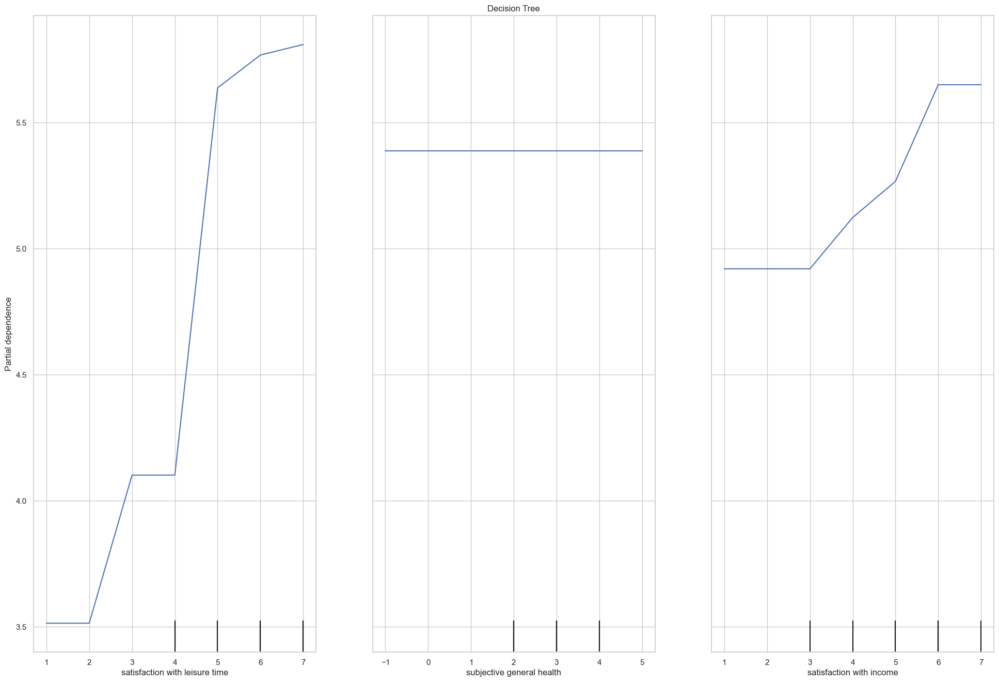

In [205]:
fig, ax = plt.subplots(figsize=(24, 16))
ax.set_title("Decision Tree")
tree_disp = PartialDependenceDisplay.from_estimator(optimal_tree, X, [
"satisfaction with leisure time",
"subjective general health",
"satisfaction with income",
], ax=ax)


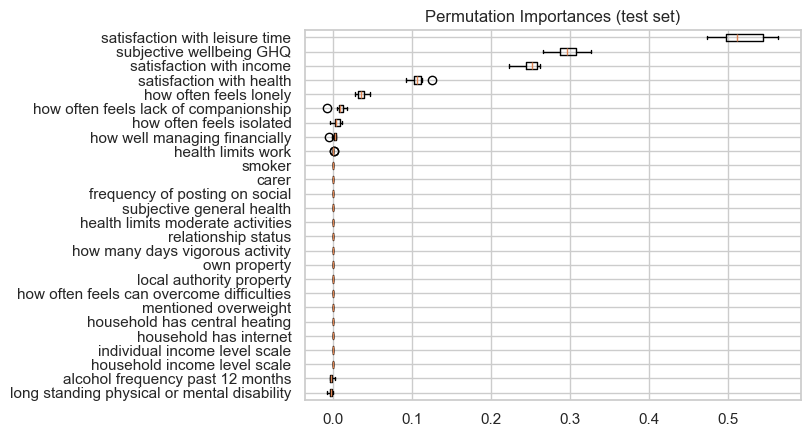

In [206]:
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt

# Calculate permutation feature importance
result = permutation_importance(optimal_tree, X_test, y_test, n_repeats=10, random_state=0, scoring='neg_mean_squared_error')

# Get importance data
importances = result.importances_mean

# Plot feature importance
fig, ax = plt.subplots()
sorted_idx = importances.argsort()
ax.boxplot(result.importances[sorted_idx].T, vert=False, labels=X_test.columns[sorted_idx])
ax.set_title("Permutation Importances (test set)")
plt.show()

In [207]:
from sklearn.metrics import r2_score

# Calculate the R-squared value
r2 = r2_score(y_test, tree_predictions)
print(f'R-squared: {r2}')

R-squared: 0.5624863999822916
